<a href="https://colab.research.google.com/github/mtwenzel/image-video-understanding/blob/master/Session_2_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image and Video Understanding, Session 2: Segmentation

In this notebook we want to train a network which segments the liver in CT data. 

Find some helpful code snippets at the end of the notebook.

## 4. Preparing for Image Segmentation

In [3]:
#@title Set TensorFlow Version to 2.x, and do basic imports { display-mode: "form" }
#%tensorflow_version 2.x
import tensorflow as tf
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPool2D, Flatten, Dense, UpSampling2D, LocallyConnected2D
from tensorflow.keras.models import Model, Sequential

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

In [98]:
#@title Check if a GPU is indeed available { display-mode: "form" }
#@markdown Sometimes, it is useful to be able to check that tensorflow (which is used internally by keras here) is able to see a real GPU. If tensorflow falls back to the CPU, your code will still work, but be *much* slower.



# print GPU device visible to tensorflow 
print('GPU:', tf.config.list_physical_devices('GPU'))

AttributeError: module 'tensorflow._api.v1.config' has no attribute 'list_physical_devices'

The first thing one needs to prepare is how to access the data:
* separation of training & test data
* random access to parts of the data (e.g. single images out of a large database)
* random permutations (shuffling)

In this notebook, we will just load data that we have prepared.  In practice, one might be interested in
* [pydicom](https://pydicom.github.io) for loading DICOM image data
* [HDF5 and h5py](https://www.h5py.org) for efficient storage of large binary data
* [numpy.random.permutation](https://docs.scipy.org/doc/numpy/reference/generated/numpy.random.permutation.html) comes in very handy for shuffling large arrays

> If you are already capable of python programming, here are some more hints how you could improve on the approach of this notebook:
> * Create a generator function that loads one batch of size `batch_size` and returns it.
> * Track which images you have already drawn, so that you can start over after one epoch (one epoch is one run through all images) with a fresh permutation.
> * Call the `fit_generator()` function instead of `fit()`.  Read the Keras documentation for this at [keras.io](http://keras.io).
>
> If you still have time and motivation, implement the same using a HDF5 file storage rather than plain disk storage.

### Download the data

We have prepared a set of abdominal CT slices, strongly downsampled, completely anonymized, together with segmentation labels which we will inspect shortly. The following cell just downloads the data to the machine this notebook runs on.


In [99]:
%%bash 
test -e tmp_slices.npz || curl -L "https://drive.google.com/uc?export=download&id=1R2-H0dhhrj6XNK7Q-MazIWGeFDOf6Zya" --output tmp_slices.npz

### Loading the data

Split into separate training and test sets.
* Training converges with about 200 slices.


In [100]:
TRAINING_SLICE_COUNT = 200 #@param {min:100, max:3300, step:100}

loaded = np.load('tmp_slices.npz')

x_train = loaded['x_train'][:TRAINING_SLICE_COUNT]
y_train = loaded['y_train'][:TRAINING_SLICE_COUNT]

x_test = loaded['x_train'][TRAINING_SLICE_COUNT:]
y_test = loaded['y_train'][TRAINING_SLICE_COUNT:]

assert len(x_train) == len(y_train)
print("Found %d training and %d testing slices" % (len(x_train),len(x_test)))
print(f"The slices have shape {x_train.shape[1:]}")

Found 200 training and 4170 testing slices
The slices have shape (76, 76)


### Inspecting the Demo Data
The PNGs used for this hands-on contain abdominal CT scans showing the liver, resampled to 4mm voxel size and after applying a liver HU window (centered at 20 HU, width 450 HU).  The corresponding segmentatio masks contain values 0 (background), 1 (liver), 2..3 (different classes of lesions):

In [101]:
print(f'Labels found in the segmentation masks: {np.unique(y_test)}')

Labels found in the segmentation masks: [0. 1. 2. 3.]


### Select example slice and plot
Have a look at different slices and their corresponding masks. 

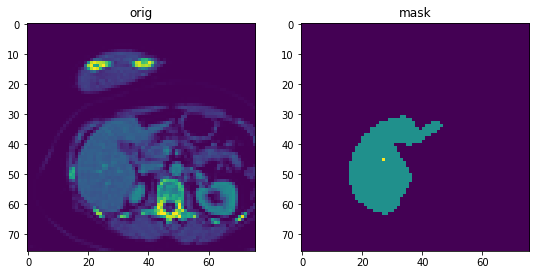

In [102]:
example_test_slice = 1800 #@param {type:"integer"}

f, ax = plt.subplots(1, 2, figsize = (9, 5))
imgplot = ax[0].imshow(x_test[example_test_slice])
ax[0].set_title('orig')
imgplot = ax[1].imshow(y_test[example_test_slice])
ax[1].set_title('mask')
plt.show()

For now, we will start with a binary segmentation problem (0: background, 1: liver), so we will remove the lesion labels / turn them into liver (value 1).

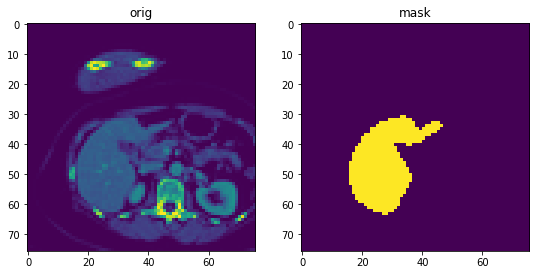

In [103]:
# remove the lesion labels (values 2..3)
y_train_binary = y_train.clip(0, 1)
y_test_binary = y_test.clip(0, 1)

f, ax = plt.subplots(1, 2, figsize = (9, 5))
imgplot = ax[0].imshow(x_test[example_test_slice])
ax[0].set_title('orig')
imgplot = ax[1].imshow(y_test_binary[example_test_slice])
ax[1].set_title('mask')
plt.show()

# 5. Segmentation: Auto Encoder (AE)-Style
* We define short functions that return a model.
* The first is a simple architecture that collapses and expands an image into the desired mask, similar to an Auto Encoder (AE).

* We will exploit different configurations
    * Convolution mode: valid vs same
    * Regularization
    * Loss functions

In [104]:
import tensorflow
tensorflow.keras.backend.image_data_format()
tensorflow.keras.backend.set_image_data_format('channels_last')
def getModel(_filters=32, filters_add=0, _kernel_size=(3,3), _padding='same', _activation='relu', _kernel_regularizer=None, _final_layer_nonlinearity='sigmoid'):
    model = Sequential()
    # We are indifferent about the xy size, but accept only one channel (gray value images). This has the consequence that debugging sizes gets harder.
    model.add(InputLayer(input_shape=(None,None,1))) 
    
    model.add(Conv2D(filters=_filters, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer, name='firstConvolutionalLayer'))
    model.add(Conv2D(filters=_filters, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer))
    model.add(MaxPool2D())

    model.add(Conv2D(filters=_filters+filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer))
    model.add(Conv2D(filters=_filters+filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer))
    model.add(MaxPool2D())

    model.add(Conv2D(filters=_filters+2*filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer))
    model.add(Conv2D(filters=_filters+2*filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer))
    model.add(UpSampling2D())

    model.add(Conv2D(filters=_filters+filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer))
    model.add(Conv2D(filters=_filters+filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer))
    model.add(UpSampling2D())

    model.add(Conv2D(filters=_filters, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer))
    model.add(Conv2D(filters=_filters, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer))

    model.add(Conv2D(1, kernel_size=(1,1), activation=_final_layer_nonlinearity))
    return model

## 5.1 Convolution Mode 'valid' vs. 'same' / Automatic Padding

In case you use convolutions with `'valid'` padding, the input size needs to be padded before submitting so that still an output corresponding to the full slice (or the patch size, respectively) is generated. A description and visualization of `'valid'` and `'same'` convolutions can be found [here](https://towardsdatascience.com/the-most-intuitive-and-easiest-guide-for-convolutional-neural-network-3607be47480) under the section "Convolution with padding and stride". The number of pixels to pad depends on the network architecture. There is an excellent technical report detailing the arithmetics to calculate the receptive field and required padding from a network definition at https://arxiv.org/pdf/1603.07285.pdf. Another description is at https://medium.com/@Synced/a-guide-to-receptive-field-arithmetic-for-convolutional-neural-networks-42f33d4378e0.

We will explore the difference later in the context of _overlapping tiles segmentation_.
The function is somewhat hard-coded for the network architecture above: it pads the input with a fixed amount of voxels in case the model gives an output that is differently sized from the inmput.

In [105]:
def pad_image_for_model(model, input_image):
    '''Determine the necessary amount of padding
    (difference between input and output size of the model)
    and apply it to an ndarry with one or more images.'''
    
    padding = 0
    if model.get_layer('firstConvolutionalLayer').padding == 'valid':
        padding = 20 # WARNING: Hard-coded for above architecture!

        # determine in which dimension to apply this padding
        ndim_padding = []
        if np.ndim(input_image) > 2:
            # do not pad along batch dimension (if present)
            ndim_padding.append((0, 0))
        ndim_padding.append((padding, padding)) # pad above/below image (y dimension)
        ndim_padding.append((padding, padding)) # pad left/right of image (x dimension)
        if np.ndim(input_image) > 3:
            # do not pad along channel dimension (if present)
            ndim_padding.append((0, 0))
        
        input_image = np.lib.pad(input_image, ndim_padding,
                                 #'constant', constant_values = 0)
                                 'reflect')

    return input_image, padding

For our small data, it is possible to train a classifier that takes full slices. However, when dealing with input of arbitrary size, this will no longer work. Images have to be partitioned, and the individual results need to be stitched into the final output. This only works when padding the input with blank or other voxels to achieve the desired output size.

### Experiment 1: 'valid' Convolutions

Get a model with padding of 'valid', i.e. the size will shrink and a proper amount of voxels need to be added prior to processing.

In [110]:
modelValid = getModel(_padding = 'valid')

modelValid.compile(loss='binary_crossentropy', optimizer='adam')
modelValid.summary()
print("Model parameters: {0:,}".format(modelValid.count_params()))

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
firstConvolutionalLayer (Con (None, None, None, 32)    320       
_________________________________________________________________
conv2d_160 (Conv2D)          (None, None, None, 32)    9248      
_________________________________________________________________
max_pooling2d_32 (MaxPooling (None, None, None, 32)    0         
_________________________________________________________________
conv2d_161 (Conv2D)          (None, None, None, 32)    9248      
_________________________________________________________________
conv2d_162 (Conv2D)          (None, None, None, 32)    9248      
_________________________________________________________________
max_pooling2d_33 (MaxPooling (None, None, None, 32)    0         
_________________________________________________________________
conv2d_163 (Conv2D)          (None, None, None, 32)  

### Experiment 2: 'same' Convolutions

Get a model with `same` padding, i.e. the input is padded with zeros before each convolution such that an output size equal to the input is achieved. 

In [113]:
modelSame = getModel()

modelSame.compile(loss='binary_crossentropy', optimizer='adam')
modelSame.summary()
print("Model parameters: {0:,}".format(modelSame.count_params()))

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
firstConvolutionalLayer (Con (None, None, None, 32)    320       
_________________________________________________________________
conv2d_190 (Conv2D)          (None, None, None, 32)    9248      
_________________________________________________________________
max_pooling2d_38 (MaxPooling (None, None, None, 32)    0         
_________________________________________________________________
conv2d_191 (Conv2D)          (None, None, None, 32)    9248      
_________________________________________________________________
conv2d_192 (Conv2D)          (None, None, None, 32)    9248      
_________________________________________________________________
max_pooling2d_39 (MaxPooling (None, None, None, 32)    0         
_________________________________________________________________
conv2d_193 (Conv2D)          (None, None, None, 32)  

## Executing code during training

This is a small interludium section that isn't directly related to the experiments around the overlapping tile concept.

In Keras (and also other frameworks), code can be executed with every iteration/batch/... Keras makes this particularly easy by offering "callbacks" where you can override one or more functions to execute your code. We will use this to generate images of the learning success after each epoch.

In [108]:
from tensorflow.keras.callbacks import Callback

class VisualHistory(Callback):
    def on_train_begin(self, logs={}):
        # also show initial prediction
        plot_prediction(self.model, example_test_slice)
    
    def on_epoch_end(self, batch, logs={}):
        # show prediction after every training epoch
        plot_prediction(self.model, example_test_slice)
        
vh_callback = VisualHistory()

Once a model is trained, you'll want to evaluate it. Predicting using a given model and then plotting one slice is implemented in this function. 

In [109]:
def do_prediction(model, input_image, verbose = False):
    # first do padding of full slice
    input_image, padding = pad_image_for_model(model, input_image)
    
    # add batch and channel dimensions (network expects 4D arrays)
    input_array = input_image[np.newaxis,:,:,np.newaxis]
    if verbose:
        print("input shape:", input_array.shape)

    y_predicted = model.predict(input_array)
    if verbose:
        print("output shape:", y_predicted.shape)

    return input_image, input_array, y_predicted, padding

def plot_prediction(model, pred_slice_index):
    # get single slice
    input_image    = x_test[pred_slice_index]
    # could use y_train_binary here for the first half of the notebook, but in the end we want to see the lesion
    reference_mask = y_test[pred_slice_index]

    input_image, input_array, y_predicted, padding = do_prediction(model, input_image)
    
    padded_extent = np.array([0, input_array.shape[2], input_array.shape[1], 0]) - 0.5 - padding

    # display prediction for inspection
    f, ax = plt.subplots(1, 5 if padding else 4, figsize = (11 if padding else 8, 3), sharey = True)
    ax[0].imshow(x_test[pred_slice_index])
    ax[0].set_title('orig')
    if padding:
        ax[1].imshow(input_array[0,:,:,0], extent = padded_extent)
        ax[1].set_title('padded input')
    ax[-2].imshow(y_predicted[0,:,:,0])
    ax[-2].set_title('predicted mask')
    ax[-3].imshow(reference_mask.clip(0,1))
    ax[-3].set_title('reference mask')
    ax[-1].imshow(reference_mask.clip(0,1) - y_predicted[0,:,:,0])
    ax[-1].set_title('(ref - predicted)')
    ax[0].set_ylim(*padded_extent[2:])
    plt.show()

## Training
* As the arrays we created before are 3-dimensional (no channel for grey images), we have to add one dimension to make it compatible with the ConvNet.
* About 100 epochs lead to a pretty well-performing net. On an average CPU, one iteration takes about 10-15 sec. On GPU, this is much faster (increase the batch size also, to avoid unneccessary GPU memory transfers)

* You can again change many parameters as for example:
    * batch_size and epochs
    * filters and kernel_size of the network (give them as parameter in the getModel()-function and recompile the model)

### Train model with 'valid' convolutions

Train on 600 samples


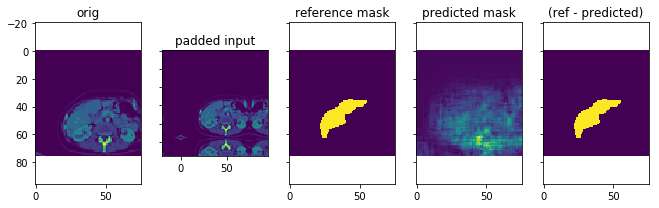

Epoch 1/5
580/600 [============================>.] - ETA: 0s - loss: 0.4432

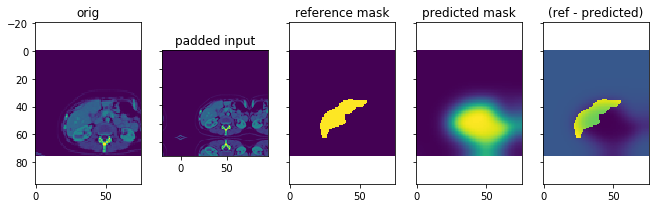

600/600 [==============================] - 16s 27ms/sample - loss: 0.4361
Epoch 2/5
580/600 [============================>.] - ETA: 0s - loss: 0.1999

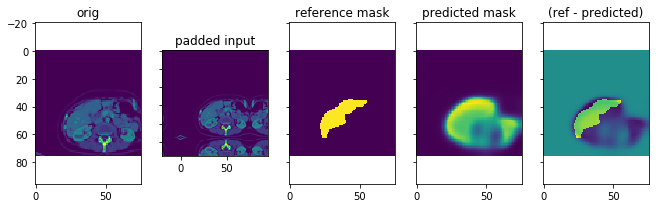

600/600 [==============================] - 16s 27ms/sample - loss: 0.1980
Epoch 3/5
580/600 [============================>.] - ETA: 0s - loss: 0.1108

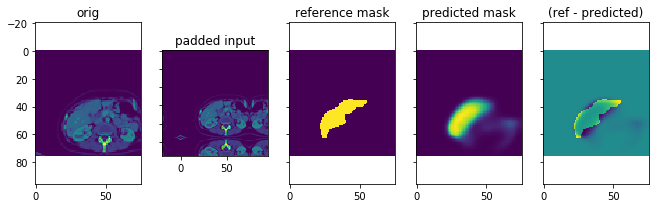

600/600 [==============================] - 16s 26ms/sample - loss: 0.1099
Epoch 4/5
580/600 [============================>.] - ETA: 0s - loss: 0.0836

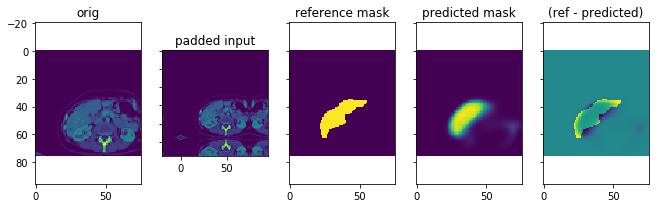

600/600 [==============================] - 16s 26ms/sample - loss: 0.0838
Epoch 5/5
580/600 [============================>.] - ETA: 0s - loss: 0.0782

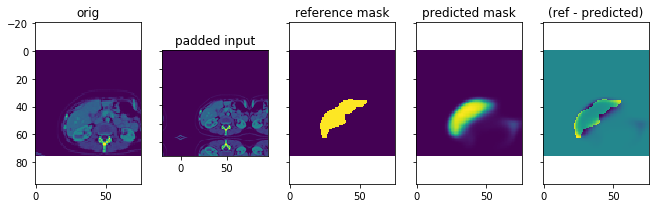

600/600 [==============================] - 16s 26ms/sample - loss: 0.0782


In [29]:
# This is for _padding = 'valid' and 'reflect' padding
historyValid = modelValid.fit(np.lib.pad(x_train[...,np.newaxis],
                                         [(0,0), (20,20), (20,20), (0,0)], 'reflect'),
                              y_train_binary[...,np.newaxis],
                              batch_size=20, epochs=5, callbacks=[vh_callback])

### Train model with 'same' convolutions

Train on 200 samples


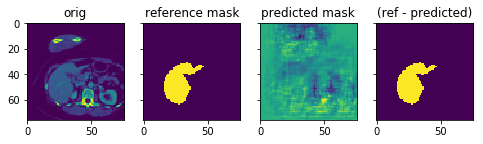

Epoch 1/100
100/200 [==============>...............] - ETA: 1s - loss: 0.6930

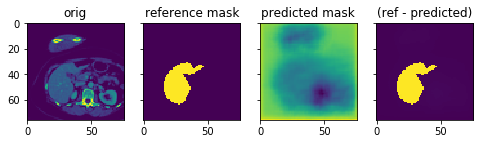

200/200 [==============================] - 2s 12ms/sample - loss: 0.6903
Epoch 2/100
100/200 [==============>...............] - ETA: 0s - loss: 0.6783

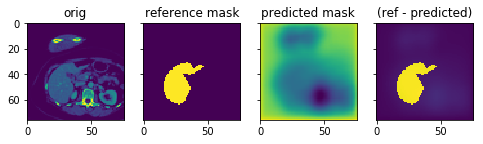

200/200 [==============================] - 2s 11ms/sample - loss: 0.6691
Epoch 3/100
100/200 [==============>...............] - ETA: 0s - loss: 0.6252

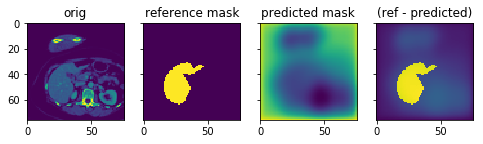

200/200 [==============================] - 2s 11ms/sample - loss: 0.6058
Epoch 4/100
100/200 [==============>...............] - ETA: 0s - loss: 0.5178

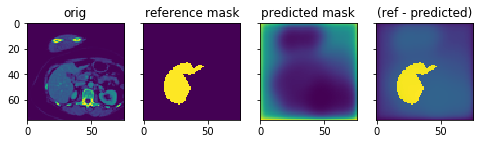

200/200 [==============================] - 2s 11ms/sample - loss: 0.5340
Epoch 5/100
100/200 [==============>...............] - ETA: 0s - loss: 0.5405

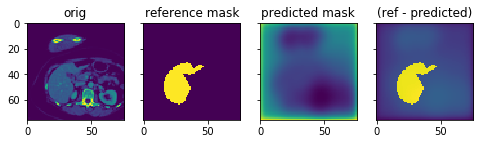

200/200 [==============================] - 2s 11ms/sample - loss: 0.4919
Epoch 6/100
100/200 [==============>...............] - ETA: 0s - loss: 0.4270

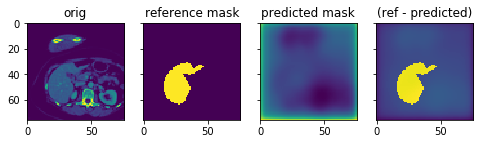

200/200 [==============================] - 2s 11ms/sample - loss: 0.4306
Epoch 7/100
100/200 [==============>...............] - ETA: 0s - loss: 0.4027

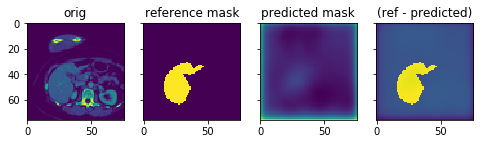

200/200 [==============================] - 2s 11ms/sample - loss: 0.3947
Epoch 8/100
100/200 [==============>...............] - ETA: 0s - loss: 0.3471

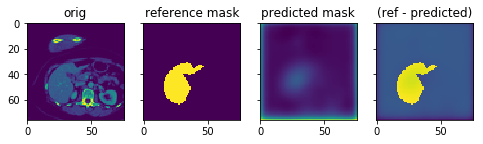

200/200 [==============================] - 2s 11ms/sample - loss: 0.3607
Epoch 9/100
100/200 [==============>...............] - ETA: 0s - loss: 0.3081

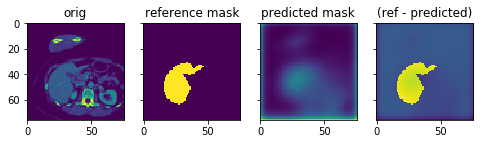

200/200 [==============================] - 2s 11ms/sample - loss: 0.3228
Epoch 10/100
100/200 [==============>...............] - ETA: 0s - loss: 0.3065

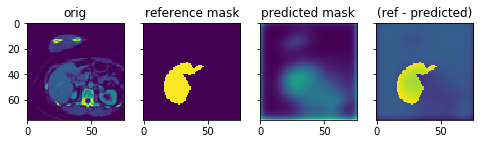

200/200 [==============================] - 2s 11ms/sample - loss: 0.2963
Epoch 11/100
100/200 [==============>...............] - ETA: 0s - loss: 0.2864

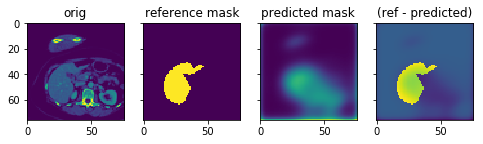

200/200 [==============================] - 2s 11ms/sample - loss: 0.2731
Epoch 12/100
100/200 [==============>...............] - ETA: 0s - loss: 0.2512

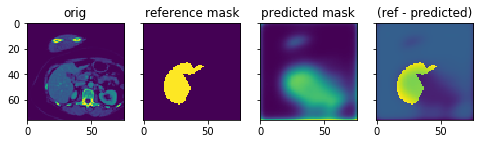

200/200 [==============================] - 2s 11ms/sample - loss: 0.2579
Epoch 13/100
100/200 [==============>...............] - ETA: 0s - loss: 0.2344

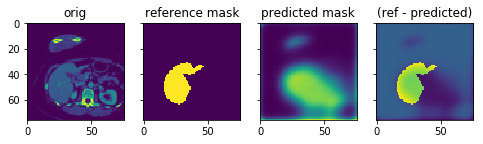

200/200 [==============================] - 2s 11ms/sample - loss: 0.2434
Epoch 14/100
100/200 [==============>...............] - ETA: 0s - loss: 0.2324

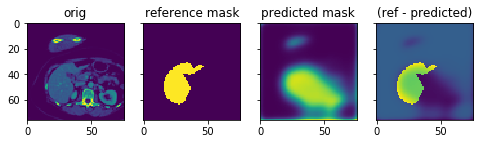

200/200 [==============================] - 2s 11ms/sample - loss: 0.2352
Epoch 15/100
100/200 [==============>...............] - ETA: 0s - loss: 0.2361

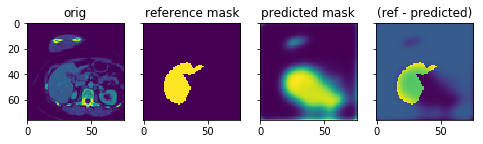

200/200 [==============================] - 2s 11ms/sample - loss: 0.2273
Epoch 16/100
100/200 [==============>...............] - ETA: 0s - loss: 0.2376

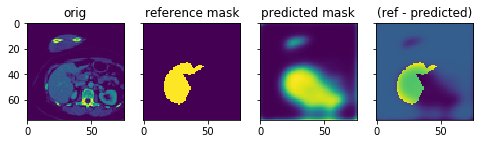

200/200 [==============================] - 2s 11ms/sample - loss: 0.2208
Epoch 17/100
100/200 [==============>...............] - ETA: 1s - loss: 0.2124

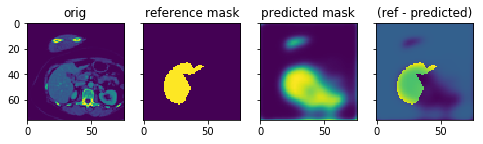

200/200 [==============================] - 2s 11ms/sample - loss: 0.2127
Epoch 18/100
100/200 [==============>...............] - ETA: 0s - loss: 0.2011

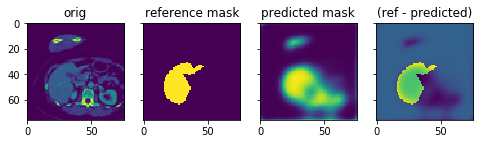

200/200 [==============================] - 2s 11ms/sample - loss: 0.2049
Epoch 19/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1943

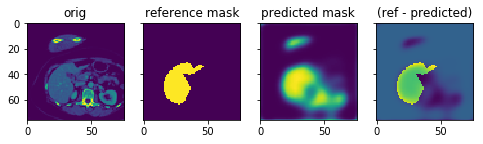

200/200 [==============================] - 2s 11ms/sample - loss: 0.1959
Epoch 20/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1856

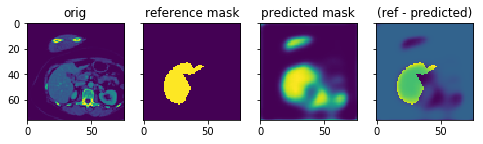

200/200 [==============================] - 2s 11ms/sample - loss: 0.1866
Epoch 21/100
100/200 [==============>...............] - ETA: 1s - loss: 0.1827

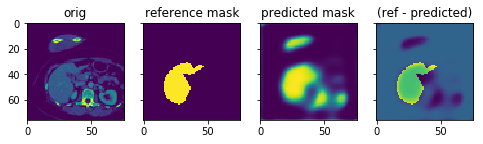

200/200 [==============================] - 2s 11ms/sample - loss: 0.1778
Epoch 22/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1648

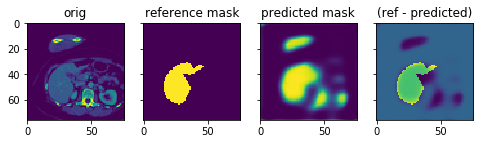

200/200 [==============================] - 2s 11ms/sample - loss: 0.1695
Epoch 23/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1563

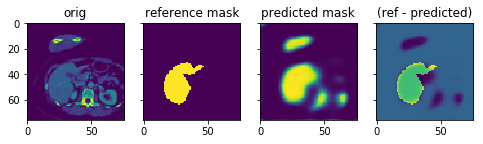

200/200 [==============================] - 2s 11ms/sample - loss: 0.1623
Epoch 24/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1524

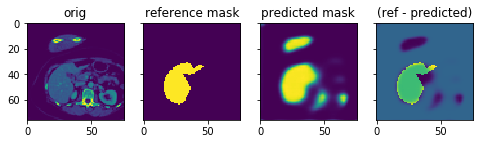

200/200 [==============================] - 2s 11ms/sample - loss: 0.1548
Epoch 25/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1545

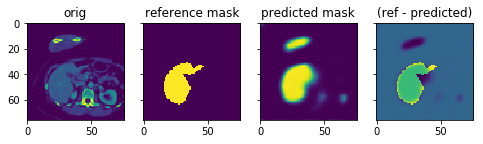

200/200 [==============================] - 2s 11ms/sample - loss: 0.1480
Epoch 26/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1423

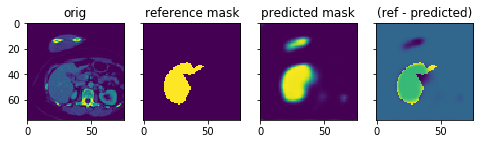

200/200 [==============================] - 2s 11ms/sample - loss: 0.1507
Epoch 27/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1443

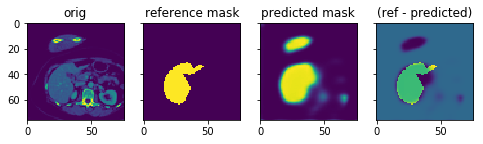

200/200 [==============================] - 2s 11ms/sample - loss: 0.1404
Epoch 28/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1414

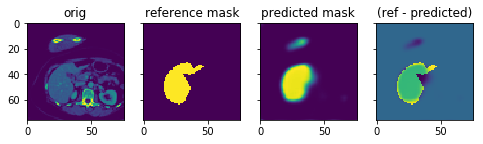

200/200 [==============================] - 2s 11ms/sample - loss: 0.1367
Epoch 29/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1389

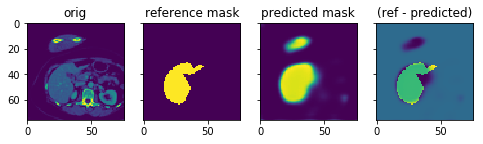

200/200 [==============================] - 2s 11ms/sample - loss: 0.1324
Epoch 30/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1345

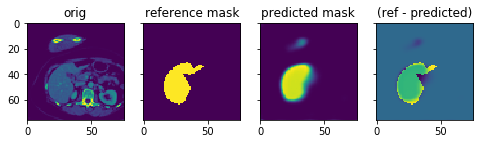

200/200 [==============================] - 2s 11ms/sample - loss: 0.1263
Epoch 31/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1308

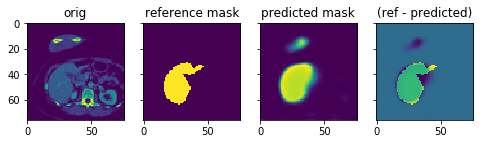

200/200 [==============================] - 2s 11ms/sample - loss: 0.1262
Epoch 32/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1194

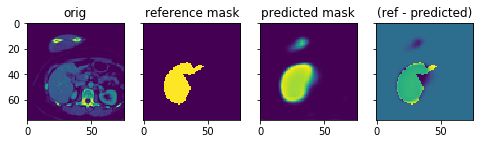

200/200 [==============================] - 2s 11ms/sample - loss: 0.1184
Epoch 33/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1118

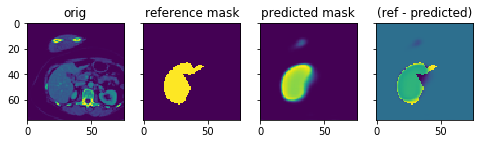

200/200 [==============================] - 2s 11ms/sample - loss: 0.1141
Epoch 34/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1150

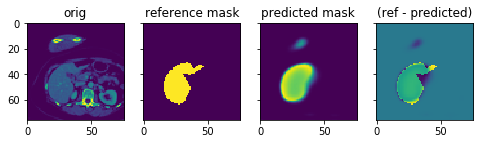

200/200 [==============================] - 2s 11ms/sample - loss: 0.1119
Epoch 35/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0966

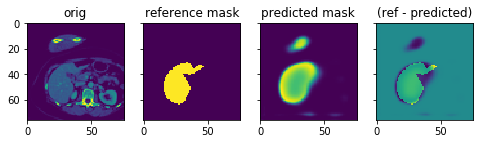

200/200 [==============================] - 2s 11ms/sample - loss: 0.1043
Epoch 36/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1265

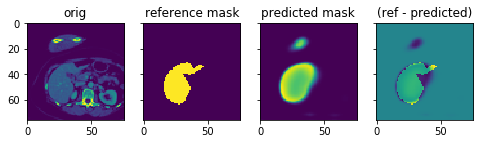

200/200 [==============================] - 2s 11ms/sample - loss: 0.1493
Epoch 37/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1065

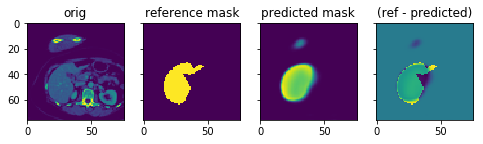

200/200 [==============================] - 2s 11ms/sample - loss: 0.1241
Epoch 38/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0947

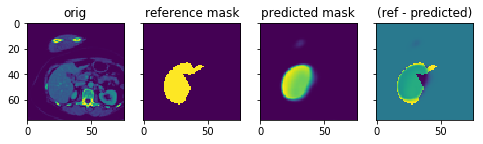

200/200 [==============================] - 2s 11ms/sample - loss: 0.1140
Epoch 39/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1073

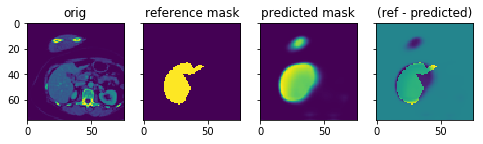

200/200 [==============================] - 2s 11ms/sample - loss: 0.1051
Epoch 40/100
100/200 [==============>...............] - ETA: 0s - loss: 0.1139

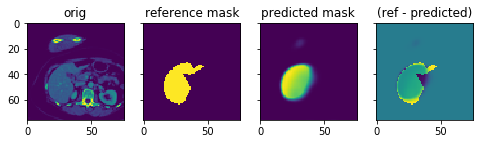

200/200 [==============================] - 2s 11ms/sample - loss: 0.1088
Epoch 41/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0934

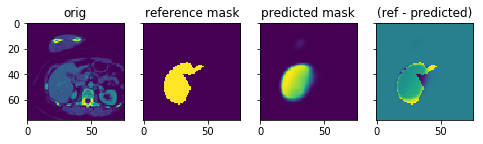

200/200 [==============================] - 2s 11ms/sample - loss: 0.1005
Epoch 42/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0973

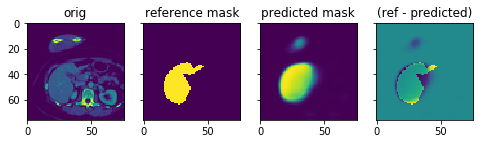

200/200 [==============================] - 2s 11ms/sample - loss: 0.0902
Epoch 43/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0984

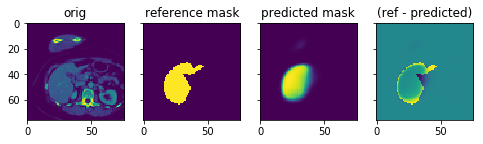

200/200 [==============================] - 2s 11ms/sample - loss: 0.0877
Epoch 44/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0840

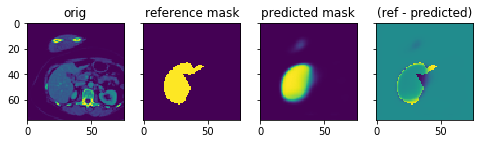

200/200 [==============================] - 2s 11ms/sample - loss: 0.0821
Epoch 45/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0718

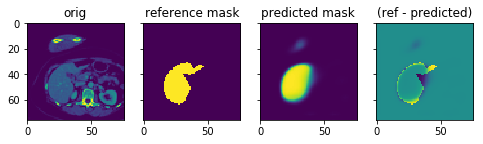

200/200 [==============================] - 2s 11ms/sample - loss: 0.0779
Epoch 46/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0724

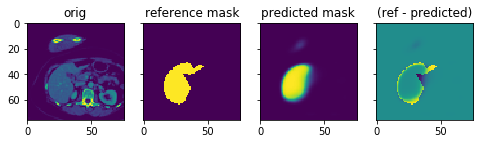

200/200 [==============================] - 2s 11ms/sample - loss: 0.0803
Epoch 47/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0733

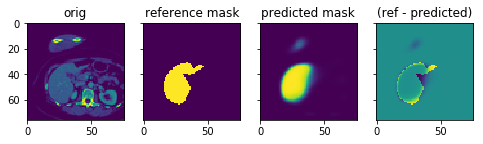

200/200 [==============================] - 2s 11ms/sample - loss: 0.0783
Epoch 48/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0756

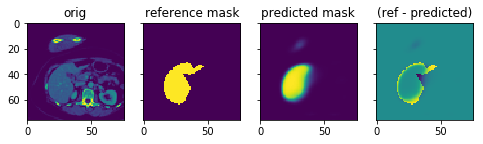

200/200 [==============================] - 2s 11ms/sample - loss: 0.0756
Epoch 49/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0745

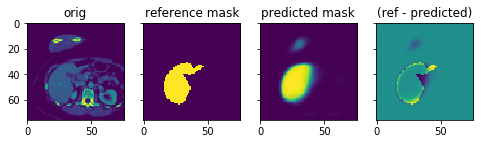

200/200 [==============================] - 2s 11ms/sample - loss: 0.0722
Epoch 50/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0735

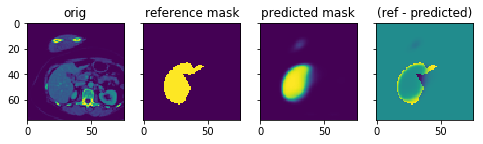

200/200 [==============================] - 2s 11ms/sample - loss: 0.0715
Epoch 51/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0682

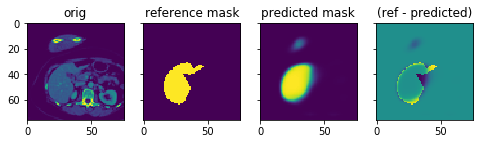

200/200 [==============================] - 2s 11ms/sample - loss: 0.0698
Epoch 52/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0695

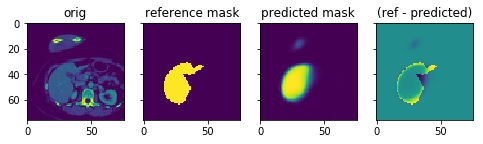

200/200 [==============================] - 2s 11ms/sample - loss: 0.0711
Epoch 53/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0665

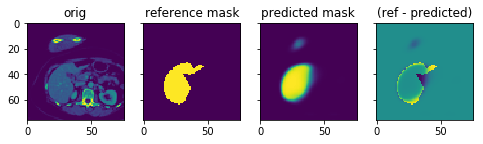

200/200 [==============================] - 2s 11ms/sample - loss: 0.0722
Epoch 54/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0686

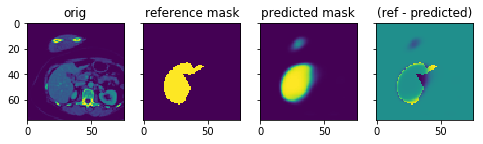

200/200 [==============================] - 2s 11ms/sample - loss: 0.0694
Epoch 55/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0663

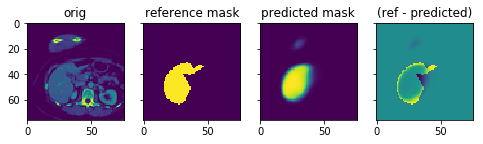

200/200 [==============================] - 2s 11ms/sample - loss: 0.0688
Epoch 56/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0673

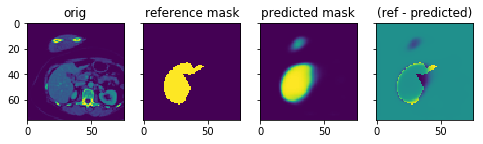

200/200 [==============================] - 2s 11ms/sample - loss: 0.0661
Epoch 57/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0665

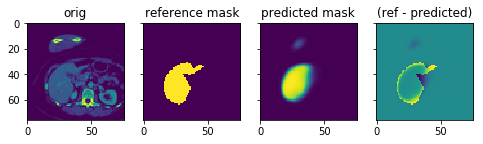

200/200 [==============================] - 2s 11ms/sample - loss: 0.0671
Epoch 58/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0692

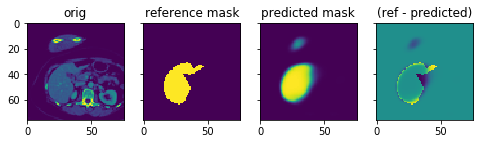

200/200 [==============================] - 2s 11ms/sample - loss: 0.0672
Epoch 59/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0640

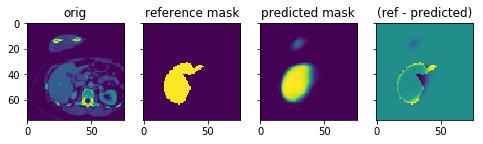

200/200 [==============================] - 2s 11ms/sample - loss: 0.0657
Epoch 60/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0622

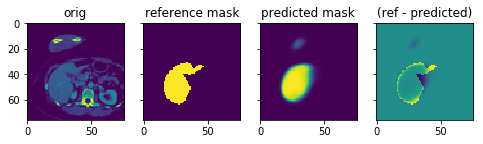

200/200 [==============================] - 2s 11ms/sample - loss: 0.0647
Epoch 61/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0589

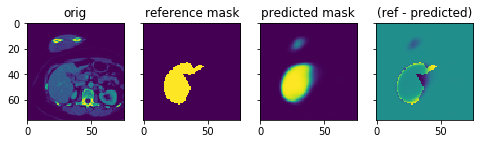

200/200 [==============================] - 2s 11ms/sample - loss: 0.0630
Epoch 62/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0624

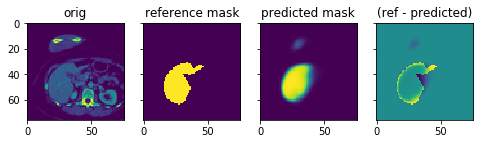

200/200 [==============================] - 2s 11ms/sample - loss: 0.0626
Epoch 63/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0617

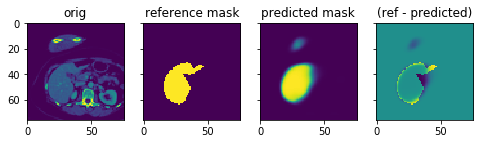

200/200 [==============================] - 2s 11ms/sample - loss: 0.0618
Epoch 64/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0659

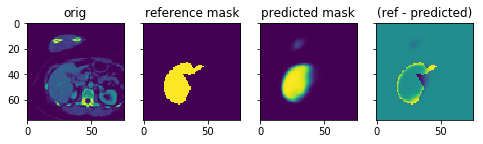

200/200 [==============================] - 2s 11ms/sample - loss: 0.0617
Epoch 65/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0678

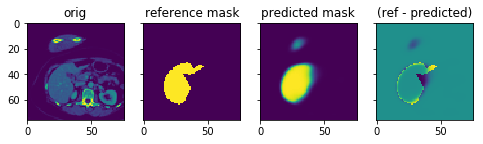

200/200 [==============================] - 2s 11ms/sample - loss: 0.0627
Epoch 66/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0631

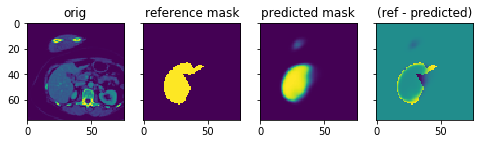

200/200 [==============================] - 2s 11ms/sample - loss: 0.0609
Epoch 67/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0619

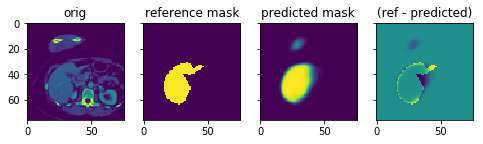

200/200 [==============================] - 2s 11ms/sample - loss: 0.0622
Epoch 68/100
100/200 [==============>...............] - ETA: 1s - loss: 0.0568

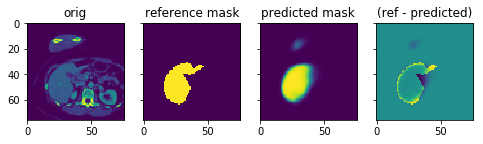

200/200 [==============================] - 2s 12ms/sample - loss: 0.0607
Epoch 69/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0605

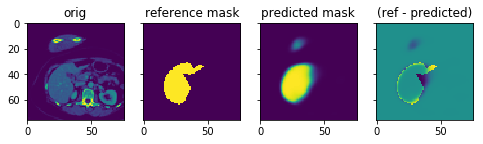

200/200 [==============================] - 2s 11ms/sample - loss: 0.0590
Epoch 70/100
100/200 [==============>...............] - ETA: 1s - loss: 0.0609

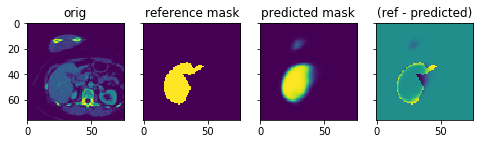

200/200 [==============================] - 2s 11ms/sample - loss: 0.0591
Epoch 71/100
100/200 [==============>...............] - ETA: 1s - loss: 0.0572

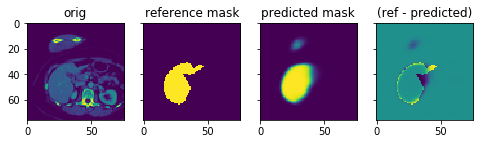

200/200 [==============================] - 2s 11ms/sample - loss: 0.0587
Epoch 72/100
100/200 [==============>...............] - ETA: 1s - loss: 0.0579

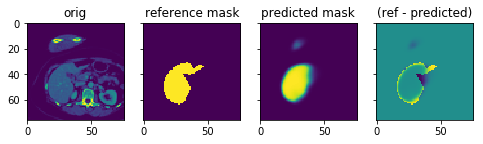

200/200 [==============================] - 2s 11ms/sample - loss: 0.0582
Epoch 73/100
100/200 [==============>...............] - ETA: 1s - loss: 0.0610

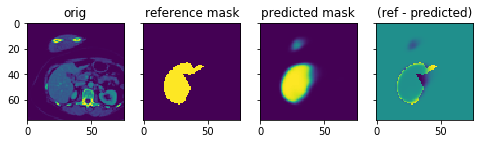

200/200 [==============================] - 2s 11ms/sample - loss: 0.0602
Epoch 74/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0564

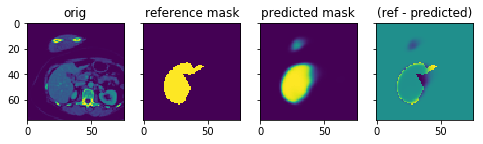

200/200 [==============================] - 2s 11ms/sample - loss: 0.0593
Epoch 75/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0628

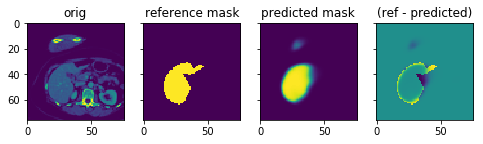

200/200 [==============================] - 2s 11ms/sample - loss: 0.0578
Epoch 76/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0630

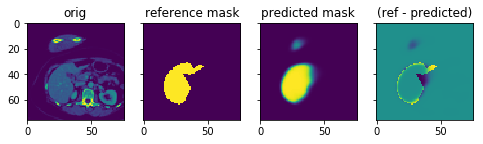

200/200 [==============================] - 2s 11ms/sample - loss: 0.0569
Epoch 77/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0534

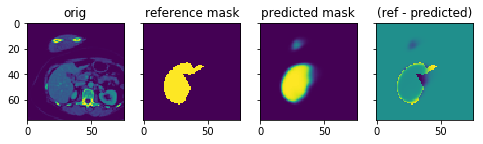

200/200 [==============================] - 2s 11ms/sample - loss: 0.0562
Epoch 78/100
100/200 [==============>...............] - ETA: 1s - loss: 0.0505

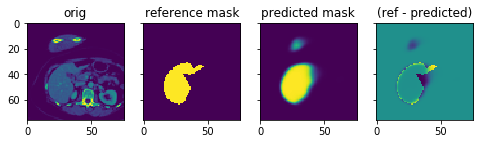

200/200 [==============================] - 2s 11ms/sample - loss: 0.0564
Epoch 79/100
100/200 [==============>...............] - ETA: 1s - loss: 0.0585

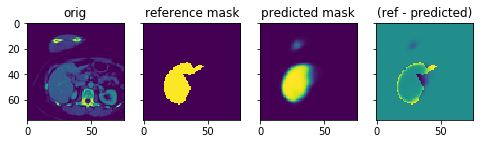

200/200 [==============================] - 2s 11ms/sample - loss: 0.0574
Epoch 80/100
100/200 [==============>...............] - ETA: 1s - loss: 0.0608

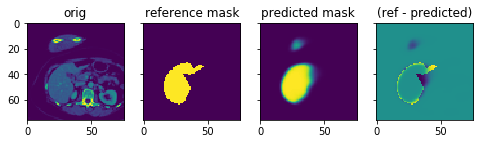

200/200 [==============================] - 2s 11ms/sample - loss: 0.0589
Epoch 81/100
100/200 [==============>...............] - ETA: 1s - loss: 0.0545

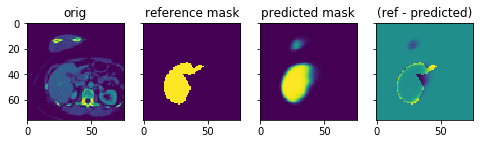

200/200 [==============================] - 2s 11ms/sample - loss: 0.0558
Epoch 82/100
100/200 [==============>...............] - ETA: 1s - loss: 0.0586

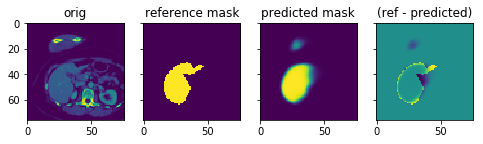

200/200 [==============================] - 2s 11ms/sample - loss: 0.0558
Epoch 83/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0542

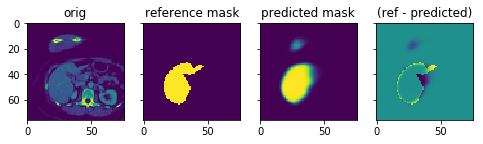

200/200 [==============================] - 2s 11ms/sample - loss: 0.0555
Epoch 84/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0563

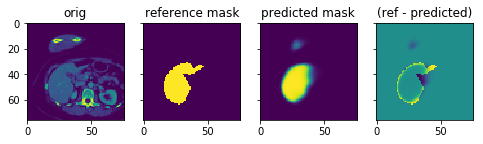

200/200 [==============================] - 2s 11ms/sample - loss: 0.0548
Epoch 85/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0582

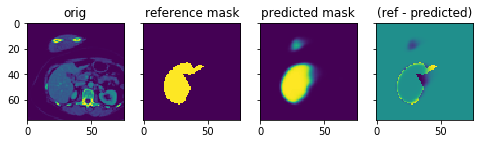

200/200 [==============================] - 2s 11ms/sample - loss: 0.0548
Epoch 86/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0522

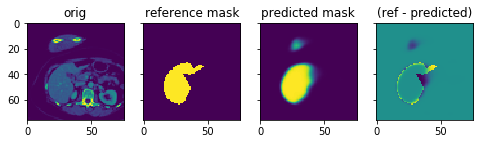

200/200 [==============================] - 2s 11ms/sample - loss: 0.0539
Epoch 87/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0523

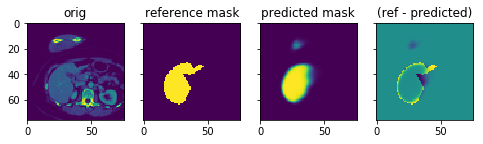

200/200 [==============================] - 2s 11ms/sample - loss: 0.0533
Epoch 88/100
100/200 [==============>...............] - ETA: 1s - loss: 0.0542

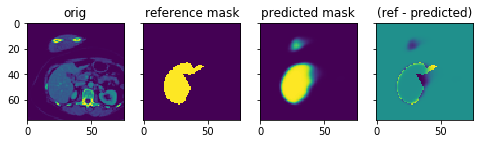

200/200 [==============================] - 2s 11ms/sample - loss: 0.0538
Epoch 89/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0516

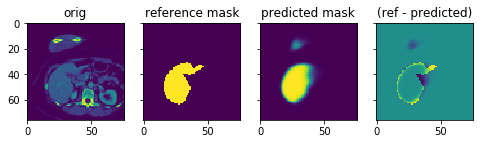

200/200 [==============================] - 2s 11ms/sample - loss: 0.0538
Epoch 90/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0545

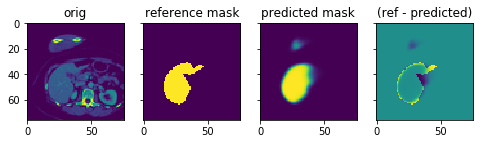

200/200 [==============================] - 2s 11ms/sample - loss: 0.0538
Epoch 91/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0552

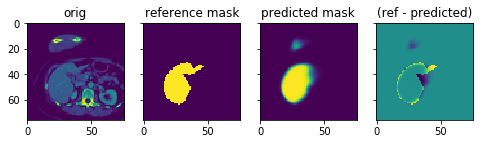

200/200 [==============================] - 2s 11ms/sample - loss: 0.0513
Epoch 92/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0539

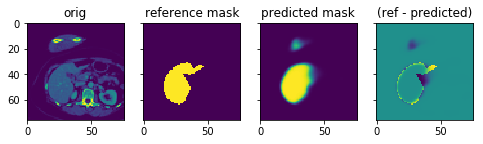

200/200 [==============================] - 2s 11ms/sample - loss: 0.0506
Epoch 93/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0498

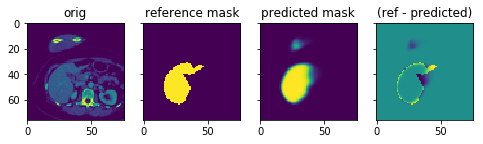

200/200 [==============================] - 2s 11ms/sample - loss: 0.0505
Epoch 94/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0470

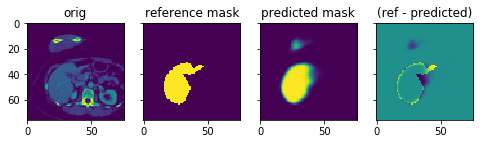

200/200 [==============================] - 2s 11ms/sample - loss: 0.0496
Epoch 95/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0487

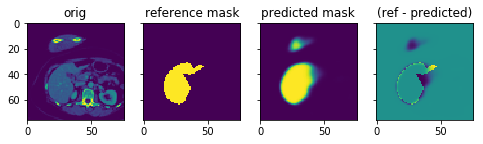

200/200 [==============================] - 2s 11ms/sample - loss: 0.0534
Epoch 96/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0640

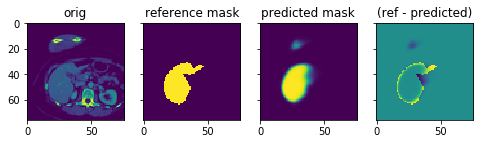

200/200 [==============================] - 2s 11ms/sample - loss: 0.0585
Epoch 97/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0598

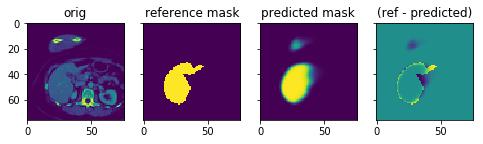

200/200 [==============================] - 2s 11ms/sample - loss: 0.0596
Epoch 98/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0483

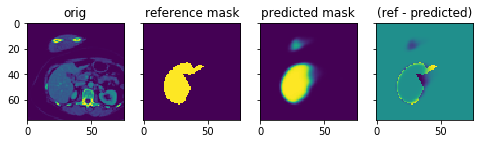

200/200 [==============================] - 2s 11ms/sample - loss: 0.0544
Epoch 99/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0534

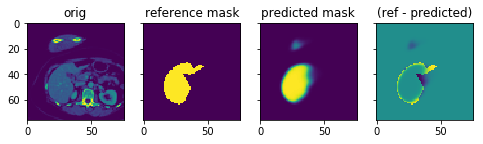

200/200 [==============================] - 2s 11ms/sample - loss: 0.0573
Epoch 100/100
100/200 [==============>...............] - ETA: 0s - loss: 0.0560

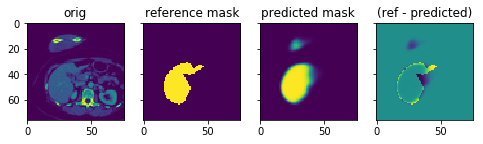

200/200 [==============================] - 2s 11ms/sample - loss: 0.0530


In [85]:
# This is for _padding = 'same'
historySame = modelSame.fit(x_train[...,np.newaxis],
                            y_train_binary[...,np.newaxis],
                            batch_size=100, epochs=100, callbacks=[vh_callback])

## Prediction
Let's look at the prediction from some more example slices, but let's only use the `x_test` slices that we did not use for training. (In a real scenario, we would do the separation of training & test data on the level of patients, *before* extracting slices, and we'd also have a validation set.)

In [58]:
slice_indices = np.random.choice(x_test.shape[0], 6)

### Evaluate model with 'valid' convolutions

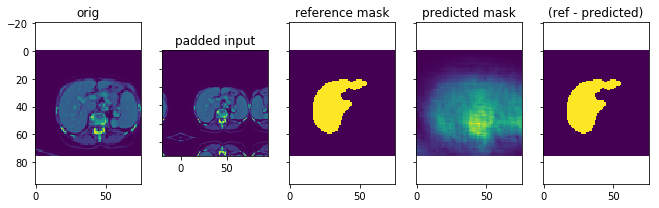

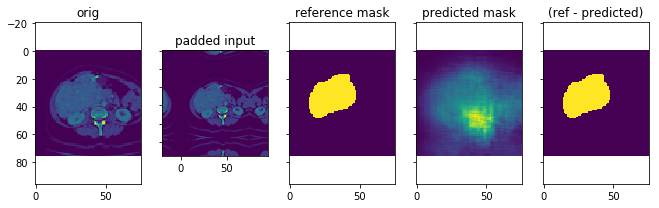

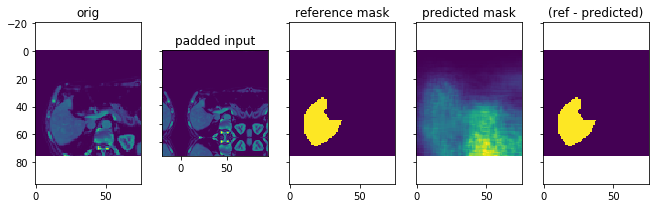

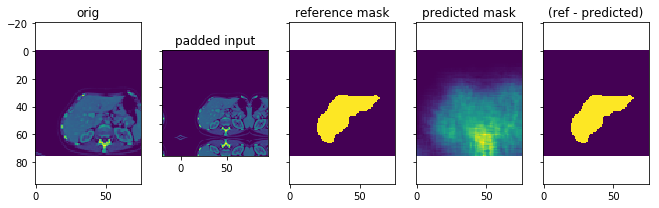

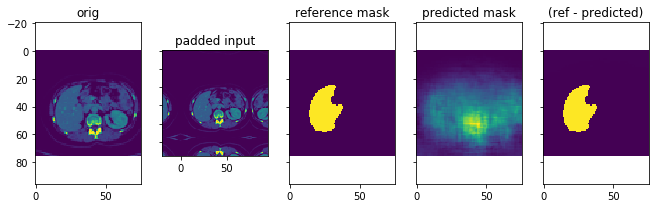

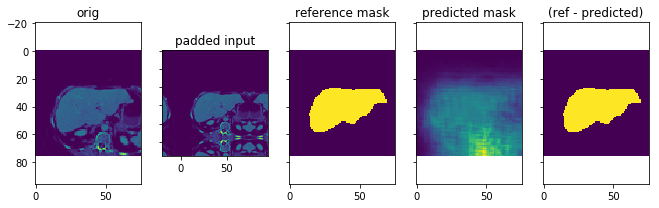

In [59]:
for a in slice_indices:
    plot_prediction(modelValid, a)

### Evaluate model with 'same' convolutions

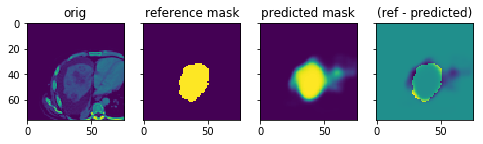

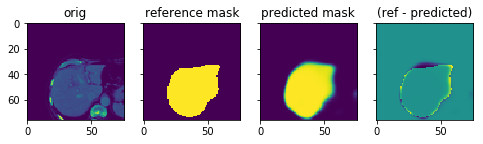

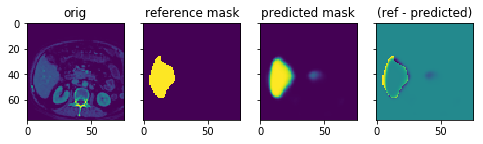

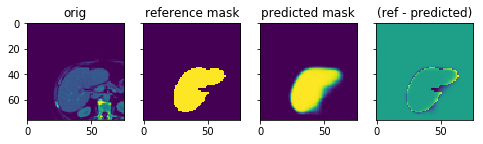

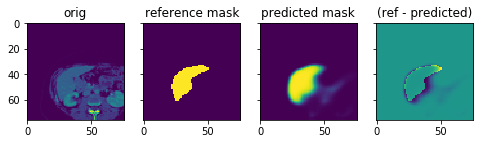

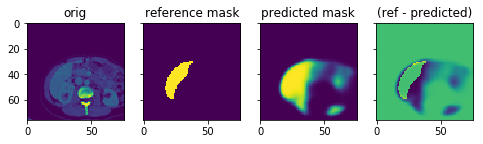

In [95]:
for a in slice_indices:
    plot_prediction(modelSame, a)

### Tile-based Prediction

Let's predict the image divided into upper and lower half, and then in full. Note that the network could also predict smaller or larger tile sizes.  Such an approach is necessary for large images, or with volumetric data and 3D convolutions, when it is not possible to have the whole image in (GPU) memory at the same time.

In [96]:
# hand-picked slice useful to visualize benefits of tiled approach
example_test_slice = 909 - TRAINING_SLICE_COUNT
assert example_test_slice > 0, 'when increasing TRAINING_SLICE_COUNT, please pick a new example slice as well'


def plot_prediction_tiled(model, pred_slice_index, tile = None):
    # get single slice
    input_image    = x_train[pred_slice_index]
    reference_mask = y_train_binary[pred_slice_index]

    # first do padding of full slice
    input_image, padding = pad_image_for_model(model, input_image)
    
    # add batch and channel dimensions (network expects 4D arrays)
    input_array = input_image[np.newaxis,:,:,np.newaxis]
    print("padded input shape:", input_array.shape)

    # then cut the specified tile box (plus padding)
    if tile is not None: # (default is full slice)
        tile = np.asarray(tile)
        assert tile.shape == (2, 2)
        padded_tile = tile.copy()
        padded_tile[:,1] += 2*padding
        input_array = input_array[:,
                                  padded_tile[0][0]:padded_tile[0][1],
                                  padded_tile[1][0]:padded_tile[1][1],
                                  :]
        reference_mask = reference_mask[tile[0][0]:tile[0][1],
                                        tile[1][0]:tile[1][1]]
        print("tiled padded shape:", input_array.shape)

    y_predicted = model.predict(input_array)
    print("output shape:", y_predicted.shape)

    padded_extent = np.array([0,input_array.shape[2],input_array.shape[1],0]) - 0.5 - padding
    orig_extent = np.array([0,reference_mask.shape[1],reference_mask.shape[0],0]) - 0.5
    if tile is not None:
        padded_extent[:2] += tile[1,0]
        padded_extent[2:] += tile[0,0]
        orig_extent[:2] += tile[1,0]
        orig_extent[2:] += tile[0,0]

    # display prediction for inspection
    f, ax = plt.subplots(1, 4 if padding else 3, figsize = (14 if padding else 12, 3), sharey = True)
    ax[0].imshow(x_train[pred_slice_index])
    ax[0].set_title('orig')
    if padding:
        ax[1].imshow(input_array[0,:,:,0], extent = padded_extent)
        ax[1].set_title('padded input')
    ax[-2].imshow(y_predicted[0,:,:,0], extent = orig_extent)
    ax[-2].set_title('predicted mask')
    ax[-1].imshow(reference_mask, extent = orig_extent)
    ax[-1].set_title('reference mask')
    ax[0].set_ylim(*padded_extent[2:])
    plt.show()

In [97]:
tile = [[0,42],[0,76]]
plot_prediction_tiled(modelSame, example_test_slice, tile)
tile = [[42,76],[0,76]]
plot_prediction_tiled(modelSame, example_test_slice, tile)
plot_prediction(modelSame, example_test_slice)

IndexError: index 709 is out of bounds for axis 0 with size 200

In [89]:
tile = [[0,42],[0,76]]
plot_prediction_tiled(modelValid, example_test_slice, tile)
tile = [[42,76],[0,76]]
plot_prediction_tiled(modelValid, example_test_slice, tile)
plot_prediction(modelValid, example_test_slice)

IndexError: index 709 is out of bounds for axis 0 with size 200

## Regularisation
* Regularisation should improve convergence. Let's try and add some Batch Normalisation first. Batch Normalisation intends to normalise the input to a (convolutional) layer, so that the values in the resulting feature maps don't get exessively large. 
    * Keras offers BatchNorm layers.
    * Include one before each convolutional layer.
* Another regularisation measure is to choose better activation functions. Probabilistic Rectified Linear Units (PReLU) crop negative values to a small epsilon, but route through any value greater than zero.
    * In Keras, activation functions are selected through the `activation=[softmax|elu|selu|relu|tanh|sigmoid|hard_sigmoid|linear]` parameter to a layer, each in quotes.
    * PReLU is one of the advanced activation functions that need to be added as a layer. It has many "trainable" parameters.
* Lastly, L1 and L2 norm can be used as additional constraints on weights, biases, and activations.
    * In Keras, this normalisation is again a parameter to the layer initialisation, using `kernel_regularizer=[l1(0.01)|l2(0.01)|l1_l2(0.01)]`.
    * You have to `from keras.regularizers import l1, l2, l1_l2` to enable this functionality.
    * You can also explore `bias_regularizer` and `activity_regularizer`.
* Make your life easier by extracting a block: Conv -- Relu -- Batch Normalization. Then play with the options -- but carefully: When you just switch everything "on", chances are you will get bad results...

In [41]:
# We will use the following block to generate the regularisation block

from tensorflow.keras.layers import BatchNormalization, LeakyReLU, PReLU

def addConvBN(model, filters=32, kernel_size=(3,3), batch_norm=True, activation='prelu', padding='same', kernel_regularizer=None, name = None):
    if batch_norm:
        model.add(BatchNormalization())
    if activation == 'prelu':
        model.add(Conv2D(filters=filters, kernel_size=kernel_size, padding=padding, activation='linear', kernel_regularizer=kernel_regularizer, name = name))
        model.add(PReLU())
    elif activation == 'lrelu':
        model.add(Conv2D(filters=filters, kernel_size=kernel_size, padding=padding, activation='linear', kernel_regularizer=kernel_regularizer, name = name))
        model.add(LeakyReLU())
    else:
        model.add(Conv2D(filters=filters, kernel_size=kernel_size, padding=padding, activation=activation, kernel_regularizer=kernel_regularizer, name = name))

In [42]:
# batch norm model
def getBNModel(_filters=32, _filters_add=0, _kernel_size=(3,3), _padding='same', _activation='prelu', _kernel_regularizer=None, _final_layer_nonlinearity='sigmoid', _num_classes=1):
    model = Sequential()
    
    # this is really ugly, but TensorFlow's batch normalization
    # currently has a limitation that it cannot work on unknown input sizes,
    # so we need to get the height & width of our training data:
    h, w = x_train.shape[1:]
    if _padding == 'valid':
        model.add(InputLayer(input_shape = (h+40, w+40, 1)))
    elif _padding == 'same':
        model.add(InputLayer(input_shape = (h, w, 1)))

    addConvBN(model, filters=_filters, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer, name='firstConvolutionalLayer')
    addConvBN(model, filters=_filters, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer)
    model.add(MaxPool2D())

    addConvBN(model, filters=_filters+_filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer)
    addConvBN(model, filters=_filters+_filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer)
    model.add(MaxPool2D())

    addConvBN(model, filters=_filters+2*_filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer)
    addConvBN(model, filters=_filters+2*_filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer)
    model.add(UpSampling2D())

    addConvBN(model, filters=_filters+_filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer)
    addConvBN(model, filters=_filters+_filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer)
    model.add(UpSampling2D())

    addConvBN(model, filters=_filters, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer)
    addConvBN(model, filters=_filters, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer)

    model.add(Conv2D(_num_classes, kernel_size=(1,1), activation=_final_layer_nonlinearity))
    return model

### Experiment 1: Batch Norm with PReLU
The following model uses Batch Normalization and the PReLU layer. Note the number of parameters when executing model.summary() and compare them to the number for the network without Batch Norm. 

In [43]:
# This network uses the PReLU layer.
modelValidBNPRelu = getBNModel(_padding='valid')
modelValidBNPRelu.compile(loss='binary_crossentropy', optimizer='adam')
modelValidBNPRelu.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batch_normalization (BatchNo (None, 116, 116, 1)       4         
_________________________________________________________________
firstConvolutionalLayer (Con (None, 114, 114, 32)      320       
_________________________________________________________________
p_re_lu (PReLU)              (None, 114, 114, 32)      415872    
_________________________________________________________________
batch_normalization_1 (Batch (None, 114, 114, 32)      128       
_________________________________________________________________
conv2d_40 (Conv2D)           (None, 112, 112, 32)      9248      
_________________________________________________________________
p_re_lu_1 (PReLU)            (None, 112, 112, 32)      401408    
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 56, 56, 32)       

Train on 200 samples


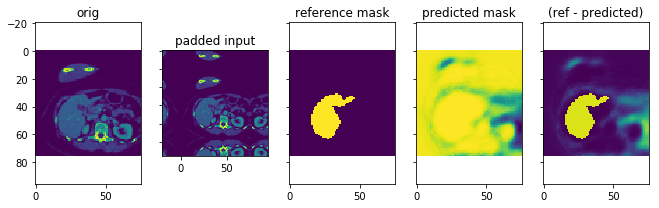

Epoch 1/5
190/200 [===========================>..] - ETA: 0s - loss: 0.0371

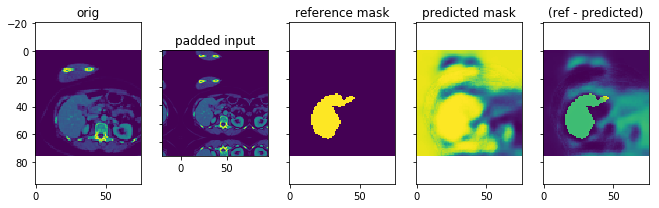

200/200 [==============================] - 5s 27ms/sample - loss: 0.0370
Epoch 2/5
190/200 [===========================>..] - ETA: 0s - loss: 0.0292

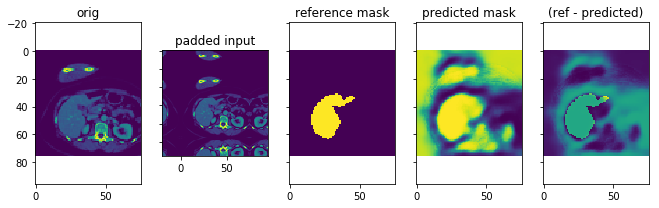

200/200 [==============================] - 5s 26ms/sample - loss: 0.0291
Epoch 3/5
190/200 [===========================>..] - ETA: 0s - loss: 0.0266

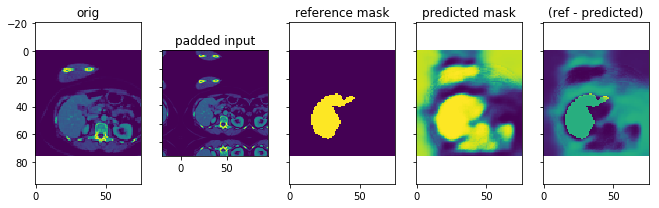

200/200 [==============================] - 5s 27ms/sample - loss: 0.0265
Epoch 4/5
190/200 [===========================>..] - ETA: 0s - loss: 0.0246

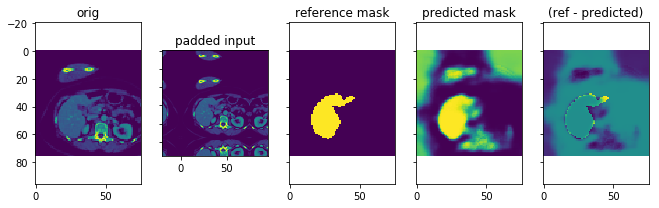

200/200 [==============================] - 5s 26ms/sample - loss: 0.0244
Epoch 5/5
190/200 [===========================>..] - ETA: 0s - loss: 0.0204

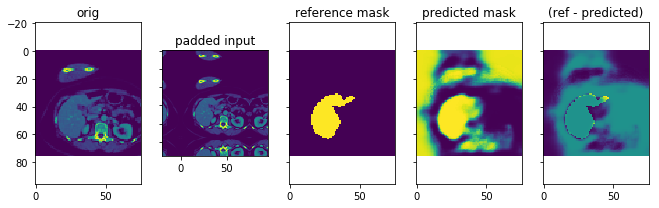

200/200 [==============================] - 5s 27ms/sample - loss: 0.0202


In [114]:
padded_x_train, padding = pad_image_for_model(modelValidBN, x_train[...,np.newaxis])
historyValidBN = modelValidBNPRelu.fit(padded_x_train,
                                  y_train_binary[...,np.newaxis],
                                  batch_size=10, epochs=5, callbacks=[vh_callback])

Have a look at the loss function for the model trained with and without Batch Normalization

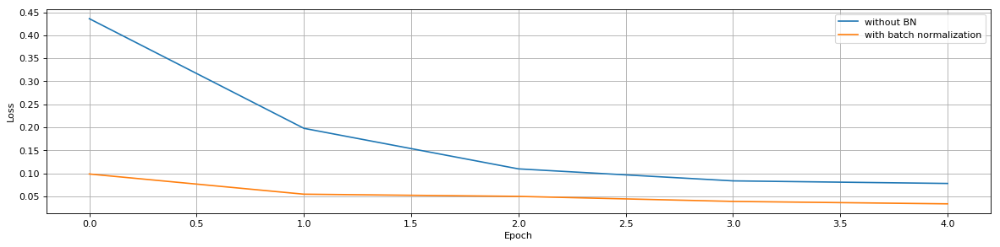

In [45]:
fig,ax = plt.subplots(figsize=(18, 4), dpi= 80, facecolor='w', edgecolor='k')
ax.plot(historyValid.history['loss'], label = 'without BN')
ax.plot(historyValidBNPRelu.history['loss'], label = 'with batch normalization')
ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
ax.grid()
ax.legend(loc = 'best')
plt.show()

With Batch Normalisation and PReLU, the number of parameters gets much larger, and training takes much longer. 
    * Does the result warrant the wait?
    * You can have a look at predictions on the test set using `plot_prediction(modelName, sliceIndex)` 

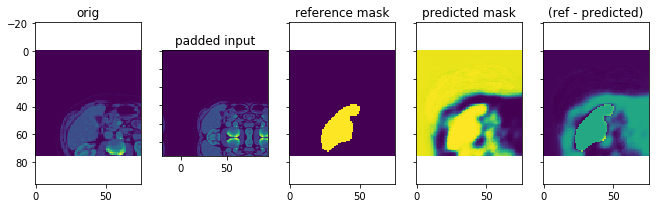

In [119]:
# For example like so...
plot_prediction(modelValidBNPRelu, 100)

Alternatively, we could use padded convolutions again:

Train on 600 samples


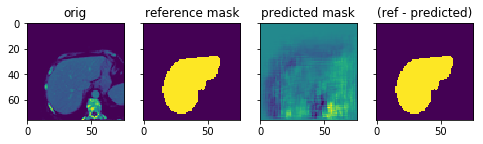

Epoch 1/5
590/600 [============================>.] - ETA: 0s - loss: 0.1251

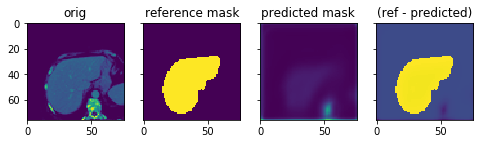

600/600 [==============================] - 10s 17ms/sample - loss: 0.1239
Epoch 2/5
590/600 [============================>.] - ETA: 0s - loss: 0.0562

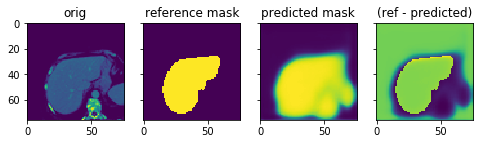

600/600 [==============================] - 10s 16ms/sample - loss: 0.0560
Epoch 3/5
590/600 [============================>.] - ETA: 0s - loss: 0.0474

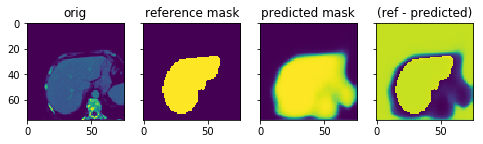

600/600 [==============================] - 10s 16ms/sample - loss: 0.0473
Epoch 4/5
590/600 [============================>.] - ETA: 0s - loss: 0.0398

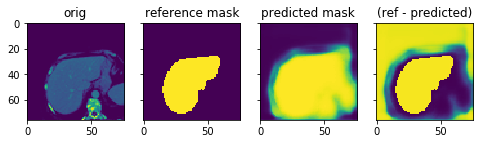

600/600 [==============================] - 10s 16ms/sample - loss: 0.0397
Epoch 5/5
590/600 [============================>.] - ETA: 0s - loss: 0.0368

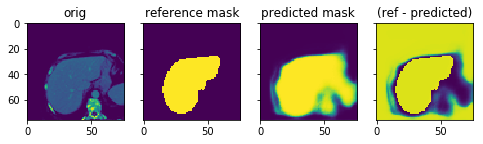

600/600 [==============================] - 10s 16ms/sample - loss: 0.0370


In [46]:
modelSameBNPRelu = getBNModel(_padding='same')
modelSameBNPRelu.compile(loss='binary_crossentropy', optimizer='adam')
historySameBNPRelu = modelSameBN.fit(x_train[...,np.newaxis], y_train_binary[...,np.newaxis],
                          batch_size=10, epochs=5, callbacks=[vh_callback]) 

### Experiment 2:  Batch Norm with ReLU

In [120]:
# Now compare with a model with ReLU (instead of PReLu)
modelValidBNRelu = getBNModel(_padding='valid', _activation='relu')
modelValidBNRelu.compile(loss='binary_crossentropy', optimizer='adam')
print("Model parameters: {0:,}".format(model.count_params()))

Model parameters: 84,741


Train on 200 samples


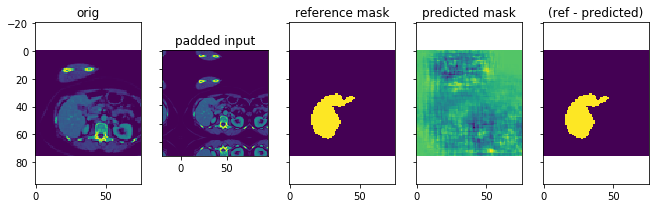

Epoch 1/75
190/200 [===========================>..] - ETA: 0s - loss: 0.2260

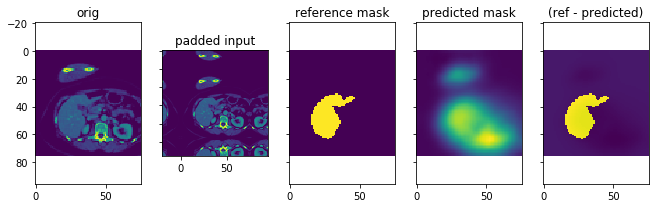

200/200 [==============================] - 5s 23ms/sample - loss: 0.2199
Epoch 2/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0819

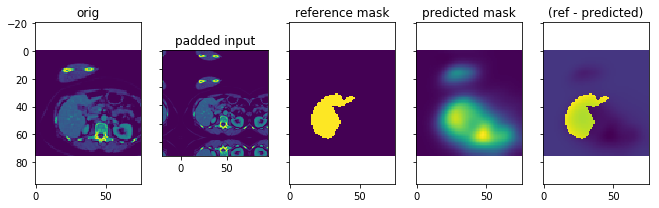

200/200 [==============================] - 4s 21ms/sample - loss: 0.0844
Epoch 3/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0726

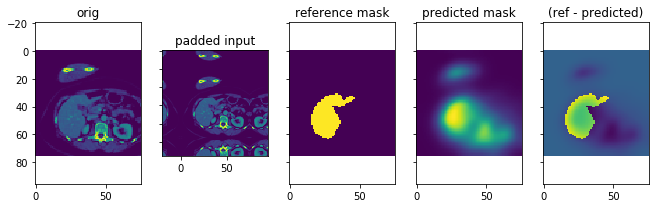

200/200 [==============================] - 4s 21ms/sample - loss: 0.0718
Epoch 4/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0631

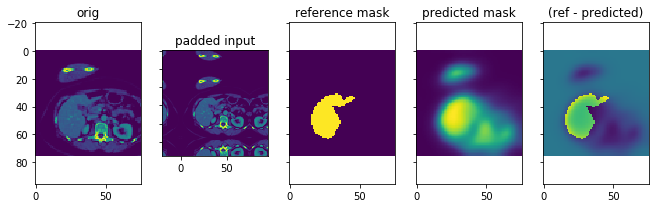

200/200 [==============================] - 4s 22ms/sample - loss: 0.0632
Epoch 5/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0520

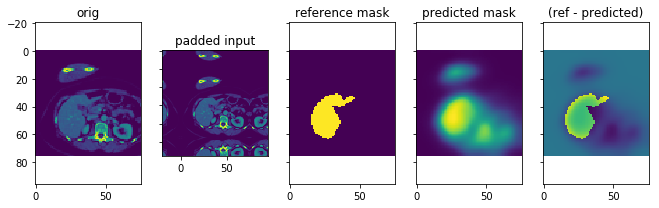

200/200 [==============================] - 4s 21ms/sample - loss: 0.0530
Epoch 6/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0525

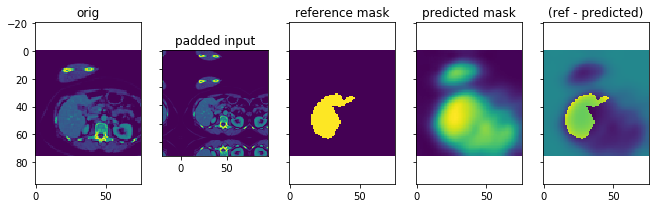

200/200 [==============================] - 4s 21ms/sample - loss: 0.0528
Epoch 7/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0580

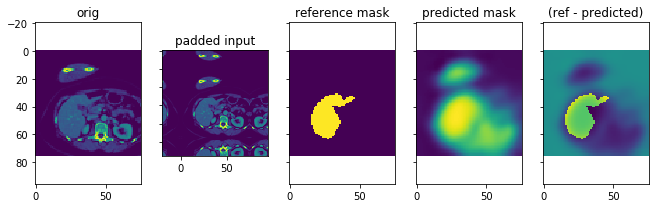

200/200 [==============================] - 4s 22ms/sample - loss: 0.0578
Epoch 8/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0448

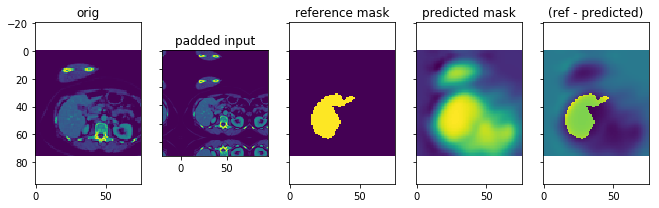

200/200 [==============================] - 4s 22ms/sample - loss: 0.0445
Epoch 9/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0425

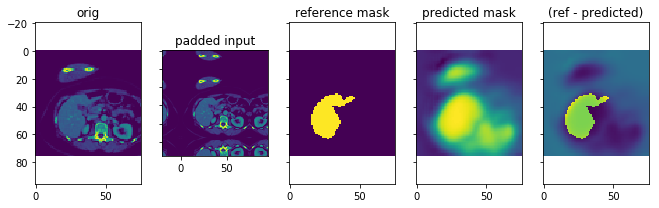

200/200 [==============================] - 4s 21ms/sample - loss: 0.0425
Epoch 10/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0429

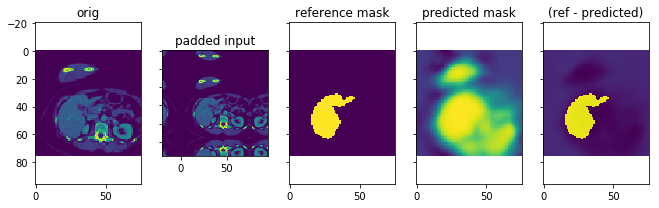

200/200 [==============================] - 4s 21ms/sample - loss: 0.0434
Epoch 11/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0548

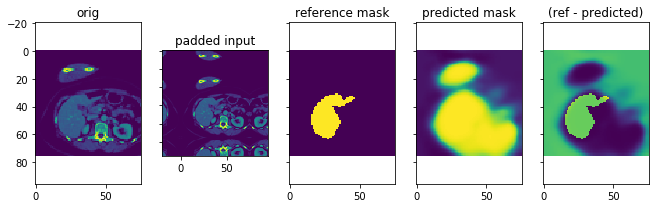

200/200 [==============================] - 4s 22ms/sample - loss: 0.0545
Epoch 12/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0442

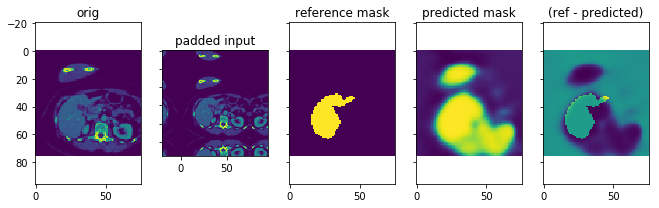

200/200 [==============================] - 4s 22ms/sample - loss: 0.0444
Epoch 13/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0344

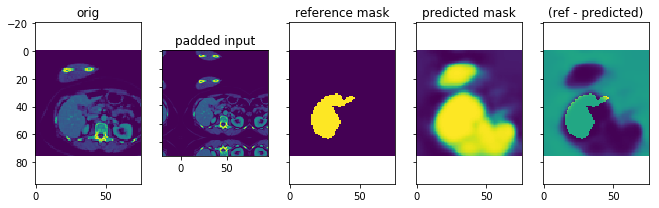

200/200 [==============================] - 4s 21ms/sample - loss: 0.0349
Epoch 14/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0319

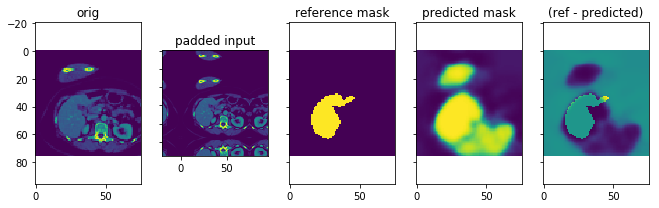

200/200 [==============================] - 4s 22ms/sample - loss: 0.0318
Epoch 15/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0323

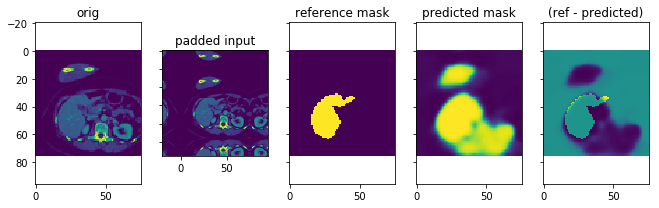

200/200 [==============================] - 4s 21ms/sample - loss: 0.0321
Epoch 16/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0287

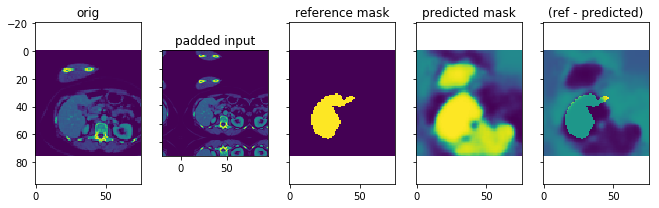

200/200 [==============================] - 4s 21ms/sample - loss: 0.0285
Epoch 17/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0278

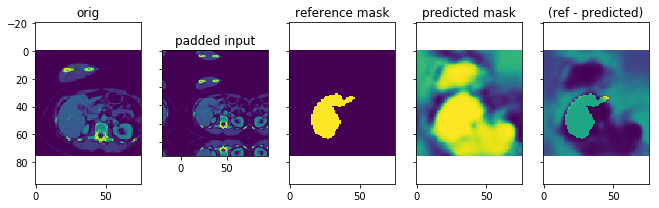

200/200 [==============================] - 4s 21ms/sample - loss: 0.0278
Epoch 18/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0236

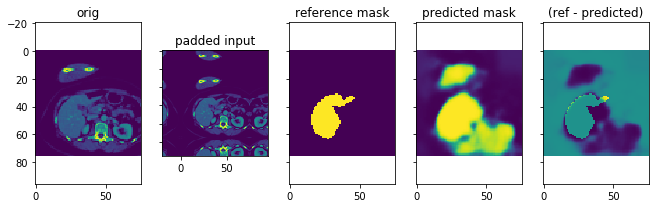

200/200 [==============================] - 4s 21ms/sample - loss: 0.0238
Epoch 19/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0270

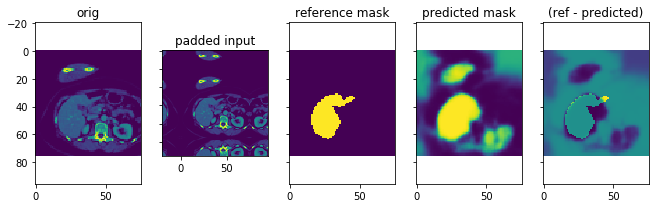

200/200 [==============================] - 4s 22ms/sample - loss: 0.0268
Epoch 20/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0295

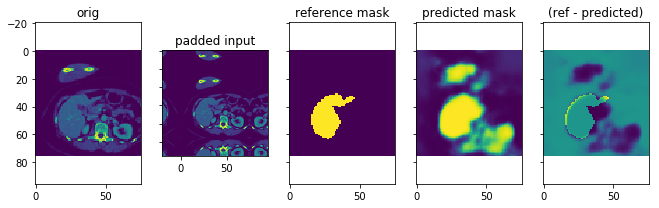

200/200 [==============================] - 4s 22ms/sample - loss: 0.0295
Epoch 21/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0268

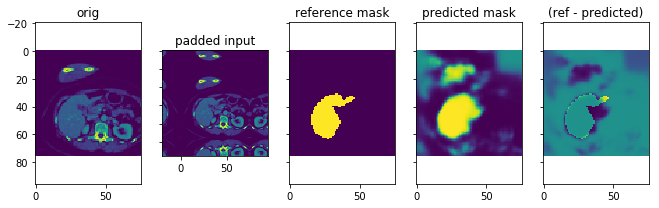

200/200 [==============================] - 4s 21ms/sample - loss: 0.0269
Epoch 22/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0239

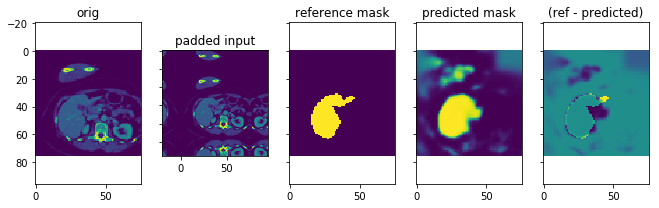

200/200 [==============================] - 4s 22ms/sample - loss: 0.0239
Epoch 23/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0198

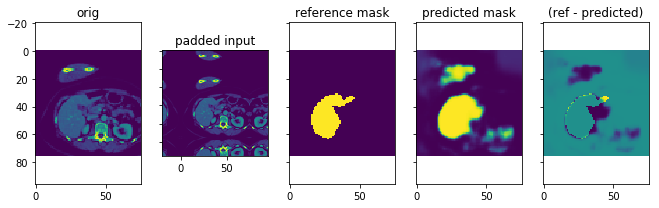

200/200 [==============================] - 4s 22ms/sample - loss: 0.0196
Epoch 24/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0215

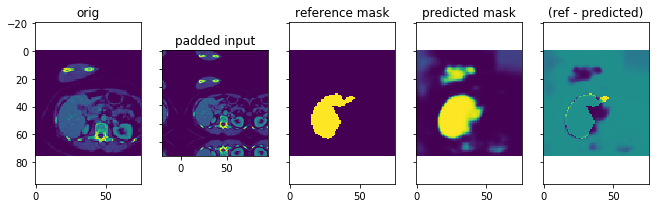

200/200 [==============================] - 4s 22ms/sample - loss: 0.0214
Epoch 25/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0218

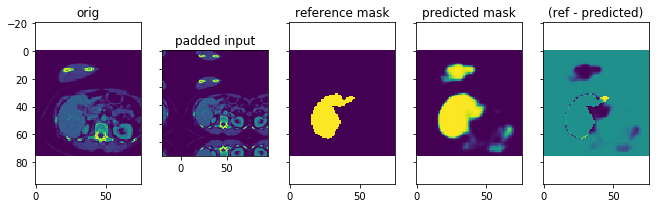

200/200 [==============================] - 4s 22ms/sample - loss: 0.0219
Epoch 26/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0215

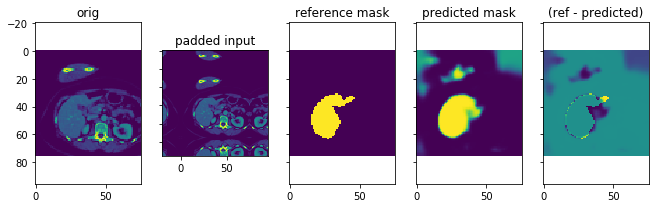

200/200 [==============================] - 4s 22ms/sample - loss: 0.0222
Epoch 27/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0279

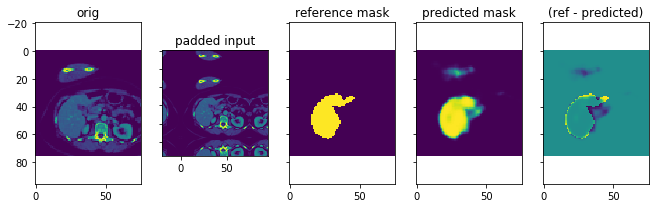

200/200 [==============================] - 4s 22ms/sample - loss: 0.0280
Epoch 28/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0292

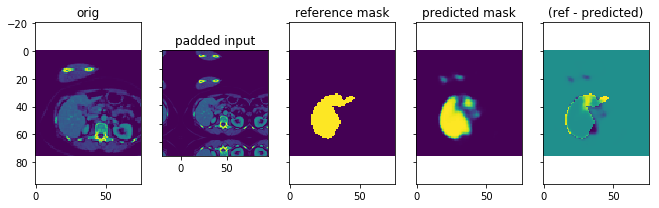

200/200 [==============================] - 4s 21ms/sample - loss: 0.0291
Epoch 29/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0237

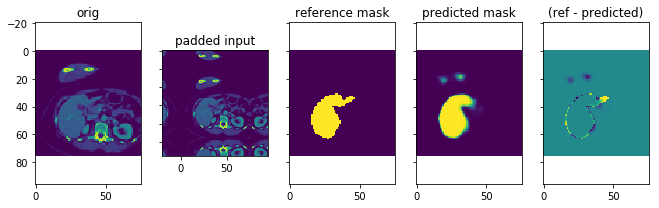

200/200 [==============================] - 4s 22ms/sample - loss: 0.0234
Epoch 30/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0188

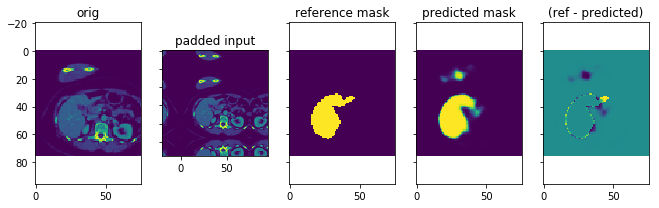

200/200 [==============================] - 4s 22ms/sample - loss: 0.0187
Epoch 31/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0173

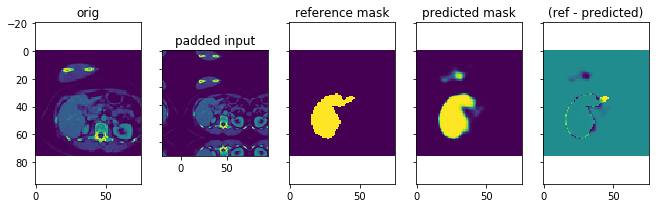

200/200 [==============================] - 4s 22ms/sample - loss: 0.0174
Epoch 32/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0162

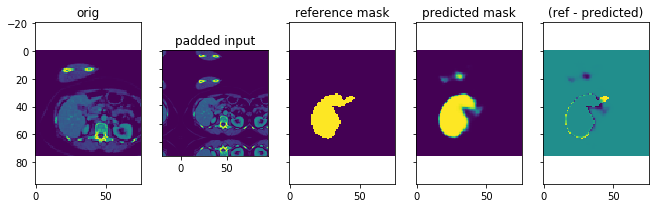

200/200 [==============================] - 4s 22ms/sample - loss: 0.0159
Epoch 33/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0159

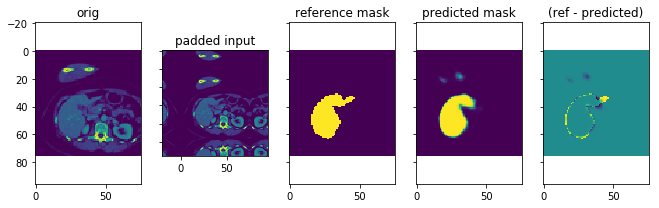

200/200 [==============================] - 4s 21ms/sample - loss: 0.0159
Epoch 34/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0158

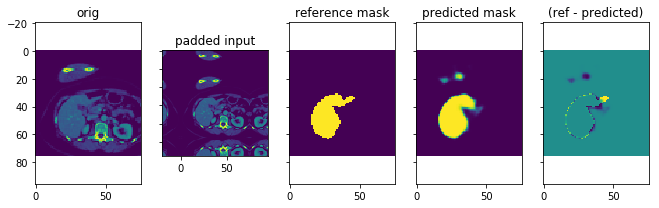

200/200 [==============================] - 4s 22ms/sample - loss: 0.0158
Epoch 35/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0148

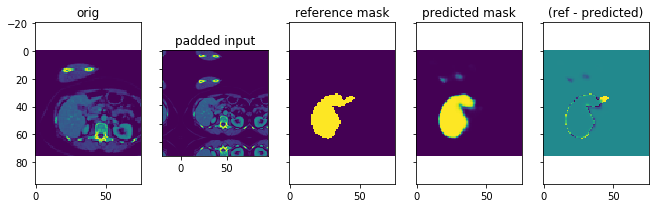

200/200 [==============================] - 4s 22ms/sample - loss: 0.0151
Epoch 36/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0142

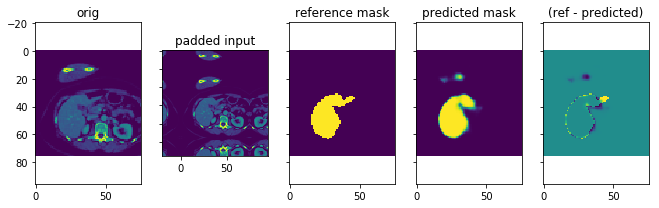

200/200 [==============================] - 4s 22ms/sample - loss: 0.0142
Epoch 37/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0136

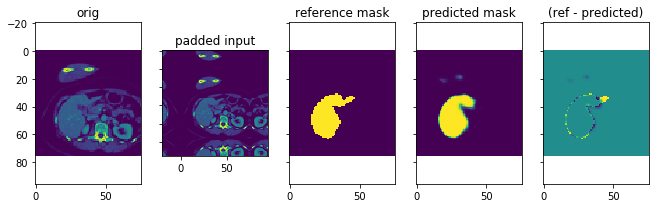

200/200 [==============================] - 4s 21ms/sample - loss: 0.0135
Epoch 38/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0144

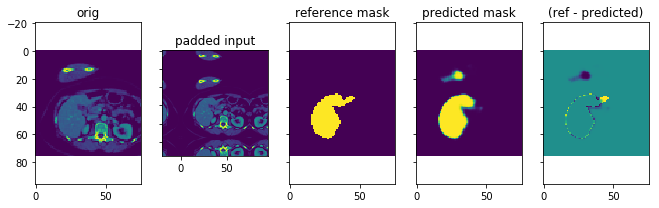

200/200 [==============================] - 4s 22ms/sample - loss: 0.0147
Epoch 39/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0151

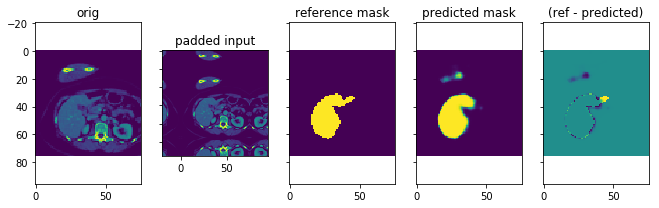

200/200 [==============================] - 4s 22ms/sample - loss: 0.0153
Epoch 40/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0140

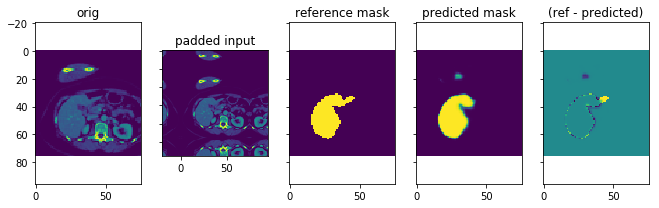

200/200 [==============================] - 4s 22ms/sample - loss: 0.0140
Epoch 41/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0124

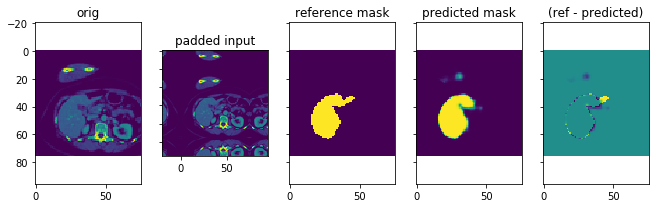

200/200 [==============================] - 4s 22ms/sample - loss: 0.0122
Epoch 42/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0130

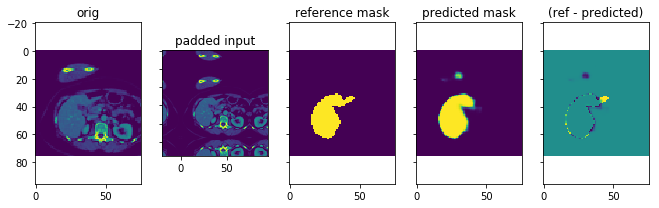

200/200 [==============================] - 4s 21ms/sample - loss: 0.0131
Epoch 43/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0117

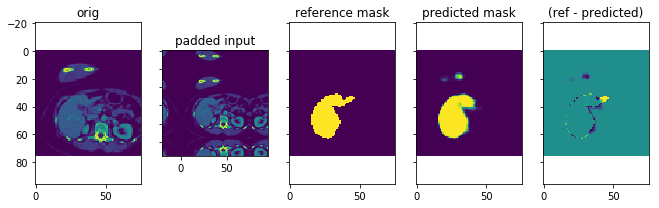

200/200 [==============================] - 4s 21ms/sample - loss: 0.0117
Epoch 44/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0107

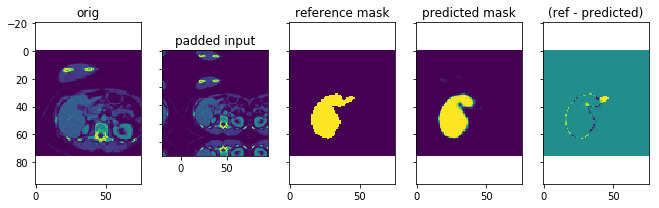

200/200 [==============================] - 4s 21ms/sample - loss: 0.0108
Epoch 45/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0114

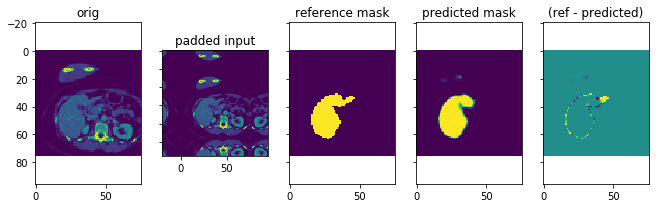

200/200 [==============================] - 4s 21ms/sample - loss: 0.0115
Epoch 46/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0103

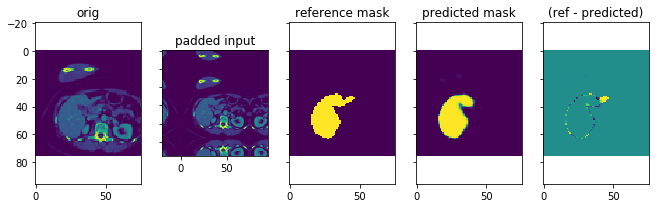

200/200 [==============================] - 4s 21ms/sample - loss: 0.0102
Epoch 47/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0102

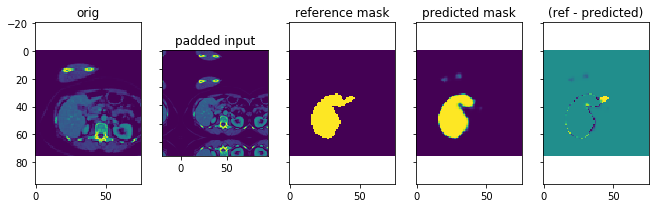

200/200 [==============================] - 4s 21ms/sample - loss: 0.0102
Epoch 48/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0089

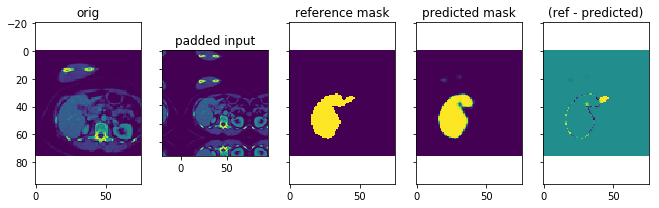

200/200 [==============================] - 4s 21ms/sample - loss: 0.0091
Epoch 49/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0091

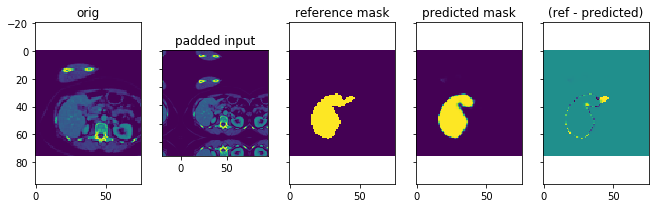

200/200 [==============================] - 4s 22ms/sample - loss: 0.0091
Epoch 50/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0095

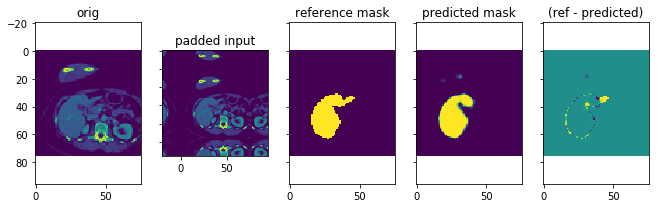

200/200 [==============================] - 4s 22ms/sample - loss: 0.0094
Epoch 51/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0087

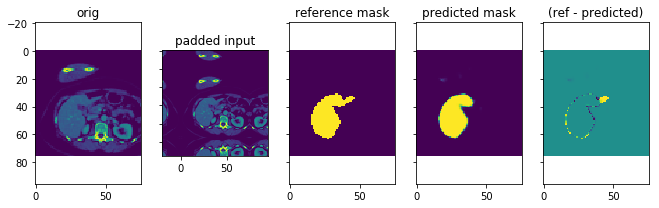

200/200 [==============================] - 5s 23ms/sample - loss: 0.0087
Epoch 52/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0088

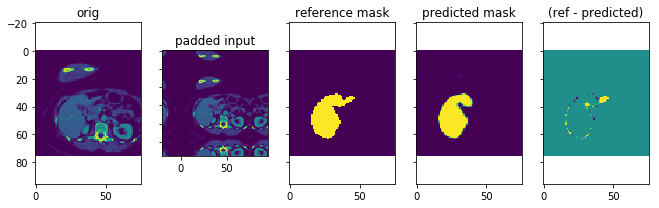

200/200 [==============================] - 4s 22ms/sample - loss: 0.0089
Epoch 53/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0088

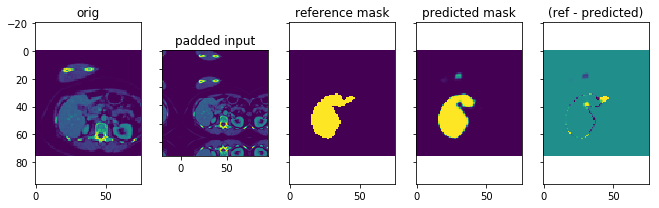

200/200 [==============================] - 5s 23ms/sample - loss: 0.0087
Epoch 54/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0084

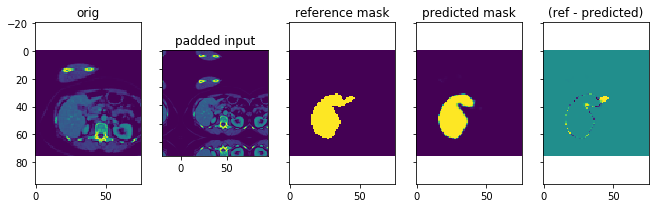

200/200 [==============================] - 4s 22ms/sample - loss: 0.0084
Epoch 55/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0082

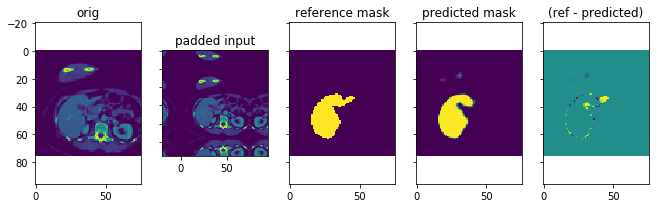

200/200 [==============================] - 4s 22ms/sample - loss: 0.0082
Epoch 56/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0087

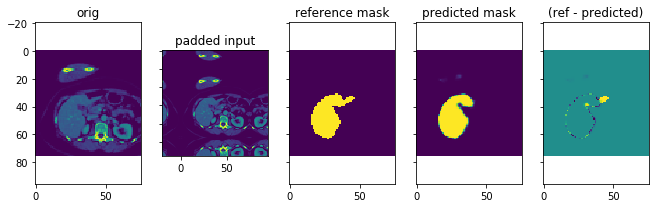

200/200 [==============================] - 5s 23ms/sample - loss: 0.0087
Epoch 57/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0100

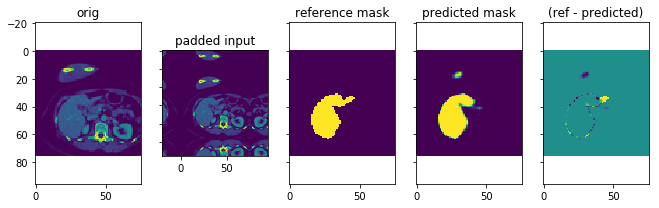

200/200 [==============================] - 5s 23ms/sample - loss: 0.0104
Epoch 58/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0116

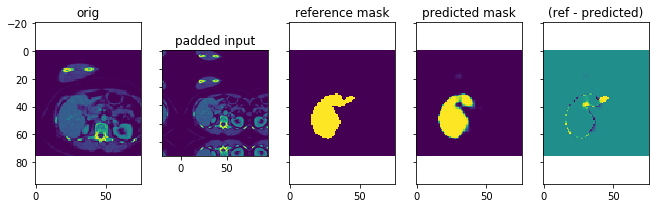

200/200 [==============================] - 5s 23ms/sample - loss: 0.0117
Epoch 59/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0115

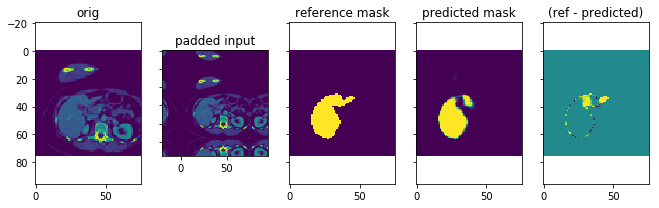

200/200 [==============================] - 4s 22ms/sample - loss: 0.0115
Epoch 60/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0097

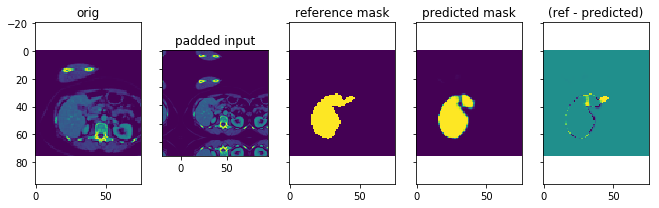

200/200 [==============================] - 4s 22ms/sample - loss: 0.0096
Epoch 61/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0084

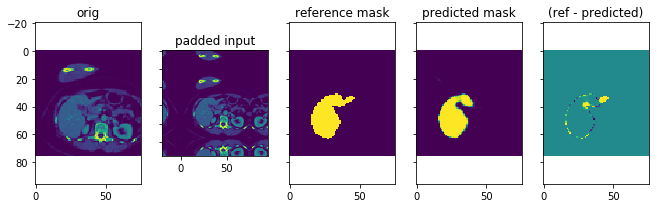

200/200 [==============================] - 4s 22ms/sample - loss: 0.0083
Epoch 62/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0085

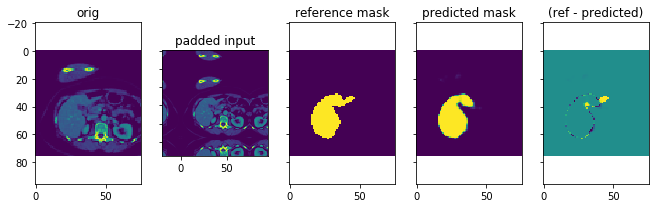

200/200 [==============================] - 4s 22ms/sample - loss: 0.0085
Epoch 63/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0073

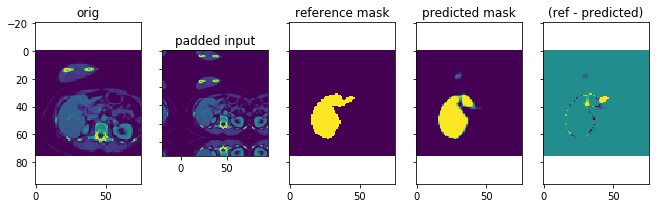

200/200 [==============================] - 4s 22ms/sample - loss: 0.0073
Epoch 64/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0069

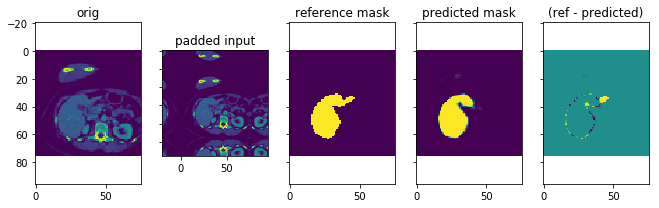

200/200 [==============================] - 4s 22ms/sample - loss: 0.0068
Epoch 65/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0067

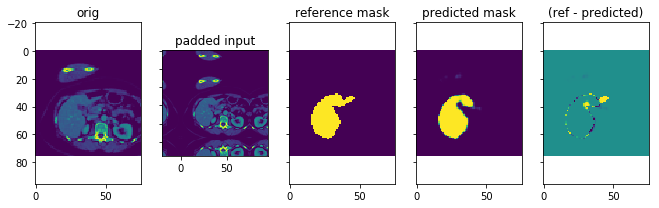

200/200 [==============================] - 4s 22ms/sample - loss: 0.0067
Epoch 66/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0076

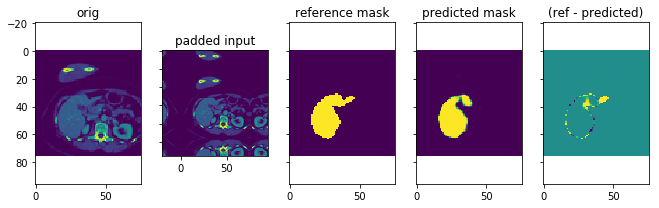

200/200 [==============================] - 4s 22ms/sample - loss: 0.0076
Epoch 67/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0084

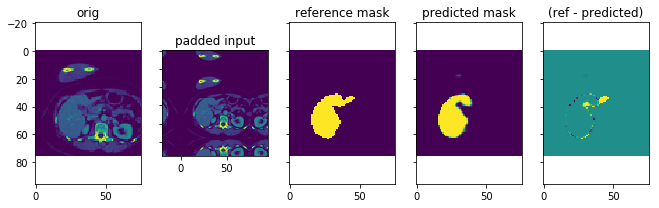

200/200 [==============================] - 4s 22ms/sample - loss: 0.0086
Epoch 68/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0089

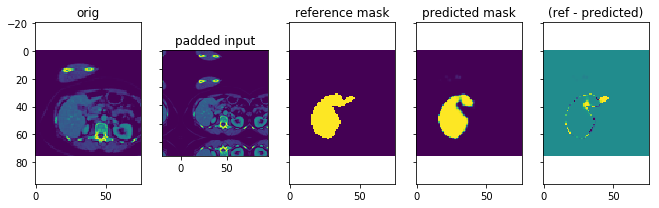

200/200 [==============================] - 5s 23ms/sample - loss: 0.0088
Epoch 69/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0080

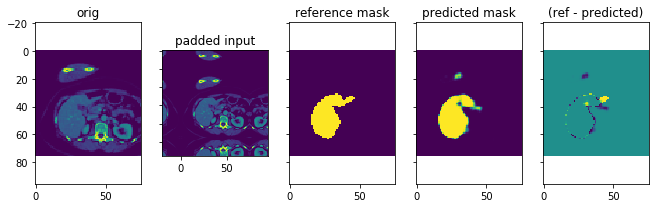

200/200 [==============================] - 5s 23ms/sample - loss: 0.0081
Epoch 70/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0085

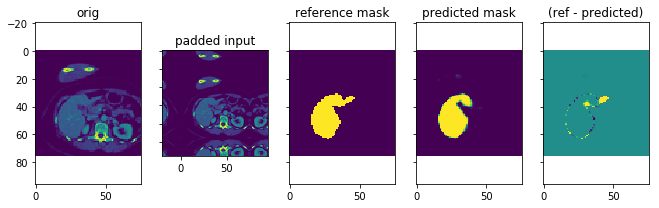

200/200 [==============================] - 4s 22ms/sample - loss: 0.0087
Epoch 71/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0090

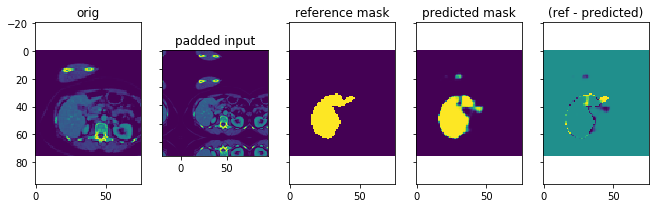

200/200 [==============================] - 4s 22ms/sample - loss: 0.0091
Epoch 72/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0096

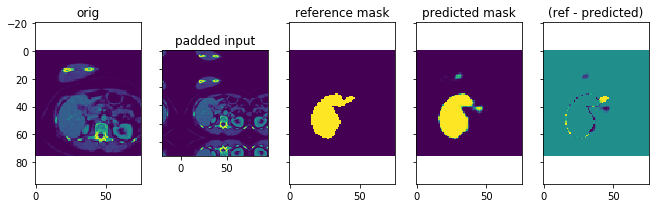

200/200 [==============================] - 4s 22ms/sample - loss: 0.0095
Epoch 73/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0076

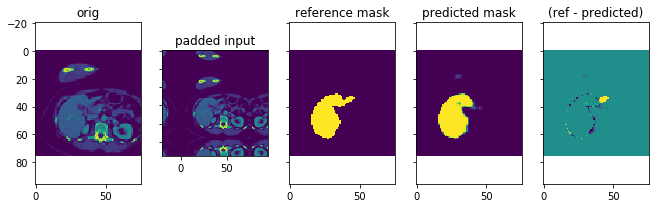

200/200 [==============================] - 4s 21ms/sample - loss: 0.0076
Epoch 74/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0070

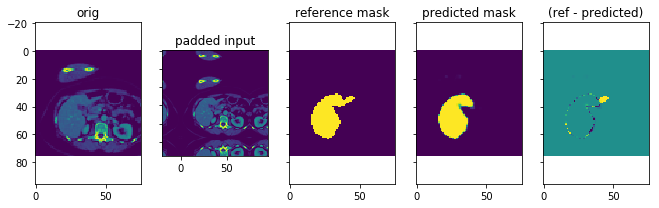

200/200 [==============================] - 4s 22ms/sample - loss: 0.0070
Epoch 75/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0066

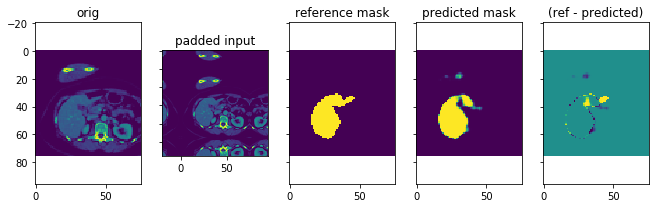

200/200 [==============================] - 4s 22ms/sample - loss: 0.0066


In [121]:
padded_x_train, padding = pad_image_for_model(model, x_train[...,np.newaxis])
historyValidBNRelu = historyValidBNRelu.fit(padded_x_train, y_train_binary[...,np.newaxis],
                    batch_size=10, epochs=75, callbacks=[vh_callback]) 

Look at the loss function and exemplary predictions (you can use code from above).

In [ ]:
# Room for code

### Regularisation using L1/L2 norm on weights


In [ ]:
from keras.regularizers import l1, l2, l1_l2

modelL2 = getModel(_padding='valid', _kernel_regularizer = l2(0.001))
modelL2.compile(loss='binary_crossentropy', optimizer='adam')
print("Model parameters: {0:,}".format(model.count_params()))

In [ ]:
padded_x_train, padding = pad_image_for_model(model, x_train[...,np.newaxis])
historyL2 = modelL2.fit(padded_x_train,
                    y_train_binary[...,np.newaxis],
                    batch_size=10, epochs=75, callbacks=[vh_callback]) 

# 6. Loss functions
* Loss functions take the predicted output, `y_pred`, and the expected output, `y_train`, and calculate their distance. The result is the minimization target.

## Loss functions: Final layer non-linearity dependency
* We have worked with binary crossentropy. See [this blog series](http://neuralnetworksanddeeplearning.com/chap3.html) for a comment:
    > When should we use the cross-entropy instead of the quadratic cost?<p>In fact, the cross-entropy is nearly always the better choice, provided the output neurons are sigmoid neurons.
* Experiment with different loss functions: `mean_squared_error | logcosh | binary_crossentropy | cosine_proximity`
* Experiment with different final layer nonlinearities: `softmax | elu | selu | relu | tanh | sigmoid | hard_sigmoid | linear`

## Loss Functions: Jaccard
Generally considered a powerful loss is also Jaccard loss; it provides larger errors and therefore more stable gradients close to the solution. $l_j = \frac{\sum |A*B|}{\sum |A| +\sum |B| -\sum |A*B|}$

In practice, we also have to prevent division by zero. The following code uses a smoothing term to avoid exploding or disapearing gradients.

In [ ]:
from tensorflow.keras import backend as K

def jaccard_distance_loss(y_true, y_pred, smooth=100):
    """
    Jaccard = (|X & Y|)/ (|X|+ |Y| - |X & Y|)
            = sum(|A*B|)/(sum(|A|)+sum(|B|)-sum(|A*B|))
    The jaccard distance loss is useful for unbalanced datasets. This has been
    shifted so it converges on 0 and is smoothed to avoid exploding or disapearing
    gradient.
    Ref: https://en.wikipedia.org/wiki/Jaccard_index
    @url: https://gist.github.com/wassname/f1452b748efcbeb4cb9b1d059dce6f96
    @author: wassname
    """
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    sum_ = K.sum(K.abs(y_true) + K.abs(y_pred), axis=-1)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return (1 - jac) * smooth

### Train model with Jaccard loss.

In [ ]:
modelJaccard = getBNModel() # Using a non-regularized model (without BN) will likely not converge.
modelJaccard.compile(loss=jaccard_distance_loss, optimizer='adam')
print("Model parameters: {0:,}".format(model.count_params()))

padded_x_train, padding = pad_image_for_model(model, x_train[...,np.newaxis])
historyJaccard = model.fit(padded_x_train, 
                    y_train_binary[...,np.newaxis], 
                    batch_size=36, epochs=40, callbacks=[vh_callback]) 

### Inspect the trained model and its predictions

In [ ]:
# Plot the loss curve
fig,ax = plt.subplots(figsize=(18, 4), dpi= 80, facecolor='w', edgecolor='k')
ax.plot(historyJaccard.history['loss'])
ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
ax.grid()
ax.legend(loc = 'best')
plt.show()

In [ ]:
# Plot a prediction
prediction_index = 10 #@param {type:'integer'}
plot_prediction(historyJaccard, prediction_index)

How is the model performance compared to the other models? 

## Loss Functions: Dice
* For segmentation, the Dice loss is also very common. $l_d = 2*\sum \frac{|A*B|} {\sum A^2 + \sum B^2}$

NB: Jaccard and Dice are very similar overlap measures and can easily be computed from each other (bijection):
<img src="https://github.com/mtwenzel/image-video-understanding/blob/master/images/jaccard_vs_dice.png?raw=1">

In [ ]:
import tensorflow.keras.backend as K

def dice_coef(y_true, y_pred, smooth=1):
    """
    Dice = (2*|X & Y|)/ (|X|+ |Y|)
         =  2*sum(|A*B|)/(sum(A^2)+sum(B^2))
    ref: https://arxiv.org/pdf/1606.04797v1.pdf
    @url: https://gist.github.com/wassname/7793e2058c5c9dacb5212c0ac0b18a8a
    @author: wassname
    """
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    return (2. * intersection + smooth) / (K.sum(K.square(y_true),-1) + K.sum(K.square(y_pred),-1) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

### Train model with Dice loss

In [ ]:
model = getBNModel()
model.compile(loss=dice_coef_loss, optimizer='adadelta')
print("Model parameters: {0:,}".format(model.count_params()))

padded_x_train, padding = pad_image_for_model(model, x_train[...,np.newaxis])
history = model.fit(padded_x_train,
                    y_train_binary[...,np.newaxis],
                    batch_size=10, epochs=75, callbacks=[vh_callback]) 

# Segmentation using a U-Net
* U-Nets are characterized by a downsampling path and an upsamling path, which allow for a pixel-wise output.
* Skip connections are used between them in order to make it easier for the network to retain fine details.
* Below is a diagram of the U-Net we will create now. You'll learn how to create it, too.
<img src="https://github.com/mtwenzel/image-video-understanding/blob/master/images/U-net_4_levels.png?raw=1" alt="U-Net diagram"/>

In [122]:
# We will use this to generate the regularisation block for the sequential model.
def addConvBNSequential(model, filters=32, kernel_size=(3,3), batch_norm=True, activation='prelu', padding='same', kernel_regularizer=None, name=None):
    if batch_norm:
        model = BatchNormalization()(model)
    if activation == 'prelu':
        model = Conv2D(filters=filters, kernel_size=kernel_size, padding=padding, activation='linear', kernel_regularizer=kernel_regularizer, name=name)(model)
        model = PReLU()(model)
    elif activation == 'lrelu':
        model = Conv2D(filters=filters, kernel_size=kernel_size, padding=padding, activation='linear', kernel_regularizer=kernel_regularizer, name=name)(model)
        model = LeakyReLU()(model)
    else:
        model = Conv2D(filters=filters, kernel_size=kernel_size, padding=padding, activation=activation, kernel_regularizer=kernel_regularizer, name=name)(model)
    return model

In [123]:
# Creates a small U-Net.
from tensorflow.keras.layers import Input, concatenate
def get_batchnorm_unet(_filters=32, _filters_add=0, _kernel_size=(3,3), _padding='same', _activation='prelu', _kernel_regularizer=None, _final_layer_nonlinearity='sigmoid', _batch_norm=True):

    h, w = x_train.shape[1:]
    if _padding == 'valid':
        input_layer = Input(shape = (h+40, w+40, 1))
    elif _padding == 'same':
        input_layer = Input(shape = (h, w, 1))

    x0 = addConvBNSequential(input_layer, filters=_filters, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer, batch_norm=_batch_norm, name = 'firstConvolutionalLayer')
    x0 = addConvBNSequential(x0,          filters=_filters, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer, batch_norm=_batch_norm)
    x1 = MaxPool2D()(x0)
    
    x1 = addConvBNSequential(x1,          filters=_filters+_filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer, batch_norm=_batch_norm)
    x1 = addConvBNSequential(x1,          filters=_filters+_filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer, batch_norm=_batch_norm)
    x2 = MaxPool2D()(x1)
    
    x2 = addConvBNSequential(x2,          filters=_filters+2*_filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer, batch_norm=_batch_norm)
    x2 = addConvBNSequential(x2,          filters=_filters+2*_filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer, batch_norm=_batch_norm)
    x3 = UpSampling2D()(x2)
    
    x3 = concatenate([x1,x3])
    x3 = addConvBNSequential(x3,          filters=_filters+_filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer, batch_norm=_batch_norm)
    x3 = addConvBNSequential(x3,          filters=_filters+_filters_add, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer, batch_norm=_batch_norm)
    x4 = UpSampling2D()(x3)
    
    x4 = concatenate([x0,x4])
    x4 = addConvBNSequential(x4,          filters=_filters, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer, batch_norm=_batch_norm)
    x4 = addConvBNSequential(x4,          filters=_filters, kernel_size=_kernel_size, padding=_padding, activation=_activation, kernel_regularizer=_kernel_regularizer, batch_norm=_batch_norm)

    output_layer = Conv2D(1, kernel_size=(1,1), activation=_final_layer_nonlinearity)(x4)
    
    model = Model(input_layer, output_layer)
    return model

In [124]:
modelUNet = get_batchnorm_unet(_activation='relu', _batch_norm=True)
modelUNet.compile(loss='binary_crossentropy', optimizer='adam')
print("Model parameters: {0:,}".format(model.count_params()))

Model parameters: 84,741


In [125]:
# It gets increasingly interesting to plot the architecture.
# (1) plotting to PNG image file
from tensorflow.keras.utils import plot_model
plot_model(modelUNet, to_file='U-Net.png', show_shapes=False, show_layer_names=True)

from IPython.display import Image
Image(filename = 'U-Net.png')

Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.


FileNotFoundError: [Errno 2] No such file or directory: 'U-Net.png'

In [126]:
# (2) plotting to SVG vector graphics format
from IPython.display import SVG
from tensorflow.keras.utils import model_to_dot

SVG(model_to_dot(modelUNet).create(prog='dot', format='svg'))

Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.


AttributeError: 'NoneType' object has no attribute 'create'

Train on 200 samples


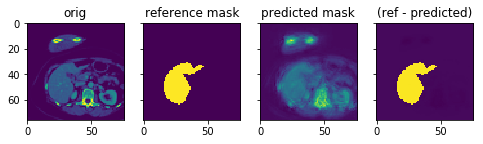

Epoch 1/75
190/200 [===========================>..] - ETA: 0s - loss: 0.2013

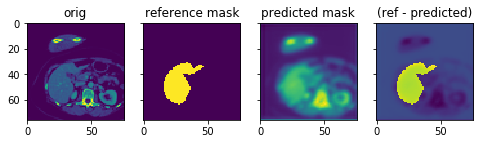

200/200 [==============================] - 4s 21ms/sample - loss: 0.1952
Epoch 2/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0800

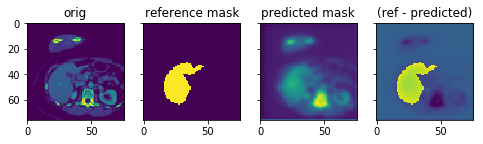

200/200 [==============================] - 4s 18ms/sample - loss: 0.0801
Epoch 3/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0558

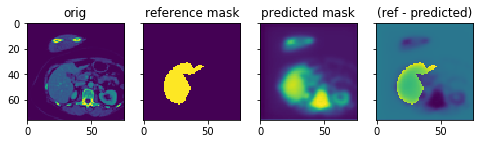

200/200 [==============================] - 4s 18ms/sample - loss: 0.0558
Epoch 4/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0485

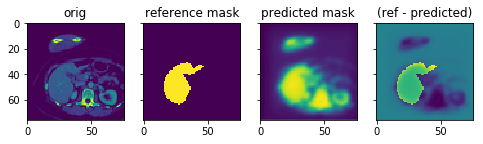

200/200 [==============================] - 4s 18ms/sample - loss: 0.0478
Epoch 5/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0482

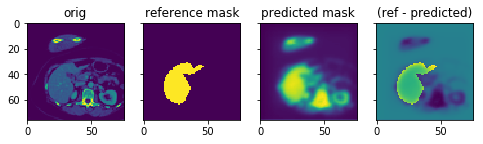

200/200 [==============================] - 4s 18ms/sample - loss: 0.0479
Epoch 6/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0382

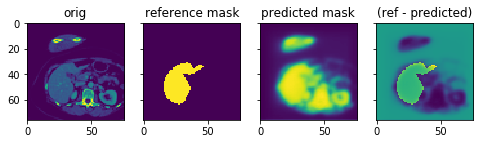

200/200 [==============================] - 4s 18ms/sample - loss: 0.0388
Epoch 7/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0390

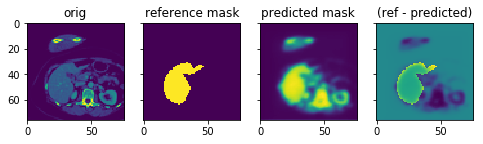

200/200 [==============================] - 4s 18ms/sample - loss: 0.0392
Epoch 8/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0419

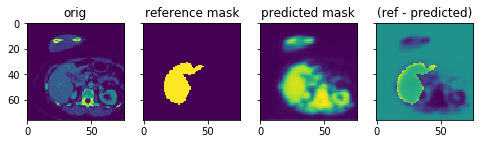

200/200 [==============================] - 4s 19ms/sample - loss: 0.0426
Epoch 9/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0399

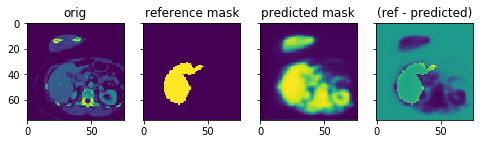

200/200 [==============================] - 4s 19ms/sample - loss: 0.0394
Epoch 10/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0427

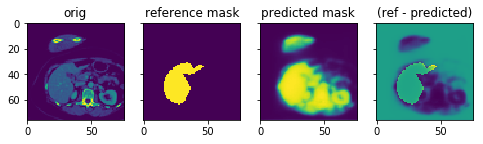

200/200 [==============================] - 4s 19ms/sample - loss: 0.0423
Epoch 11/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0346

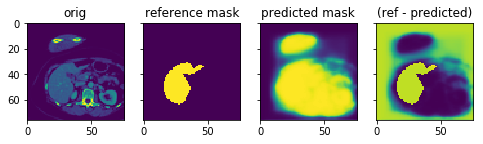

200/200 [==============================] - 4s 19ms/sample - loss: 0.0347
Epoch 12/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0323

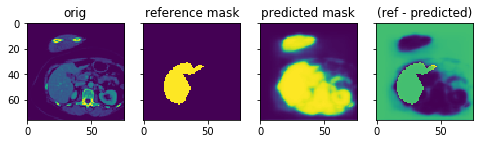

200/200 [==============================] - 4s 19ms/sample - loss: 0.0322
Epoch 13/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0287

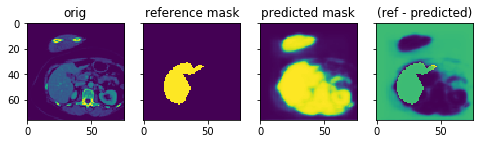

200/200 [==============================] - 4s 19ms/sample - loss: 0.0284
Epoch 14/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0245

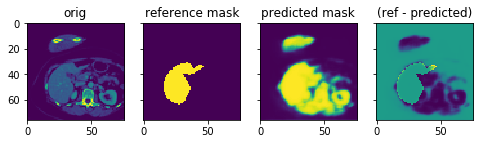

200/200 [==============================] - 4s 19ms/sample - loss: 0.0246
Epoch 15/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0269

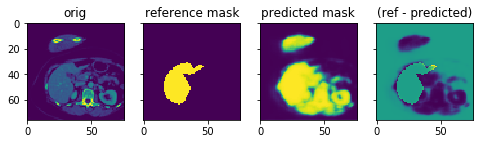

200/200 [==============================] - 4s 19ms/sample - loss: 0.0274
Epoch 16/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0271

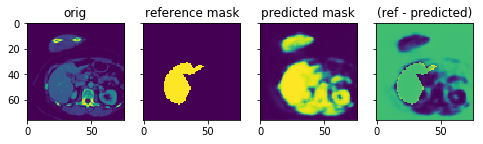

200/200 [==============================] - 4s 18ms/sample - loss: 0.0271
Epoch 17/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0246

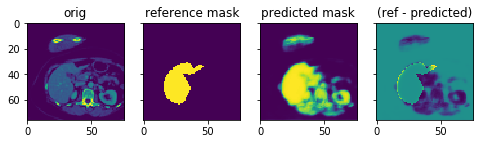

200/200 [==============================] - 4s 18ms/sample - loss: 0.0242
Epoch 18/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0234

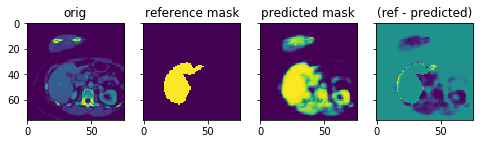

200/200 [==============================] - 4s 19ms/sample - loss: 0.0235
Epoch 19/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0229

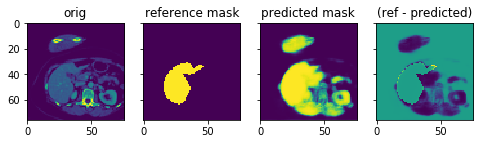

200/200 [==============================] - 4s 19ms/sample - loss: 0.0235
Epoch 20/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0206

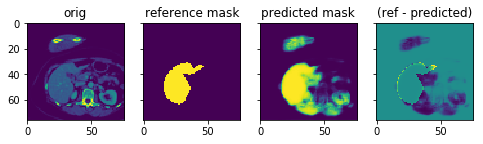

200/200 [==============================] - 4s 18ms/sample - loss: 0.0211
Epoch 21/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0216

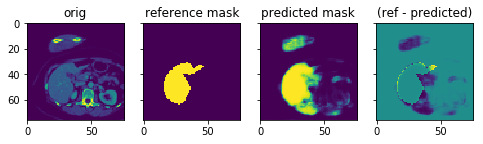

200/200 [==============================] - 4s 19ms/sample - loss: 0.0213
Epoch 22/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0181

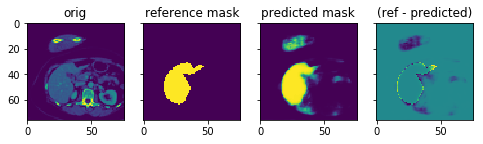

200/200 [==============================] - 4s 18ms/sample - loss: 0.0182
Epoch 23/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0176

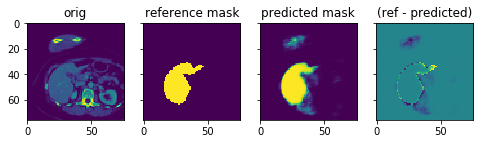

200/200 [==============================] - 4s 18ms/sample - loss: 0.0177
Epoch 24/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0154

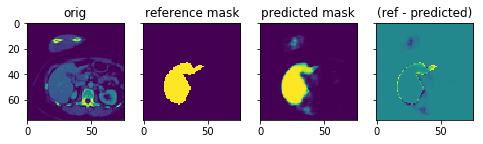

200/200 [==============================] - 4s 18ms/sample - loss: 0.0154
Epoch 25/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0144

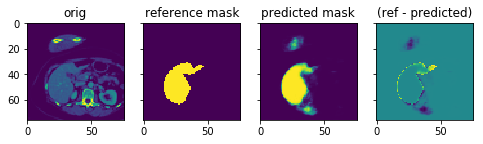

200/200 [==============================] - 4s 18ms/sample - loss: 0.0143
Epoch 26/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0139

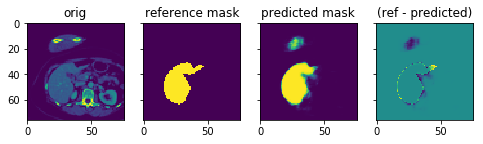

200/200 [==============================] - 4s 19ms/sample - loss: 0.0140
Epoch 27/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0156

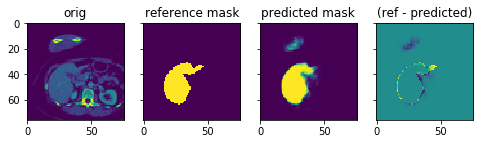

200/200 [==============================] - 4s 18ms/sample - loss: 0.0155
Epoch 28/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0188

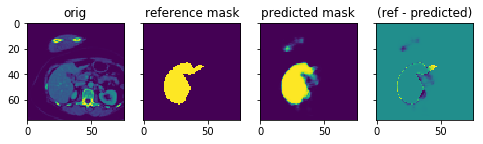

200/200 [==============================] - 4s 18ms/sample - loss: 0.0183
Epoch 29/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0142

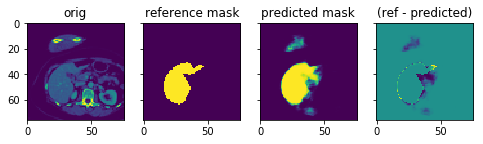

200/200 [==============================] - 4s 18ms/sample - loss: 0.0146
Epoch 30/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0198

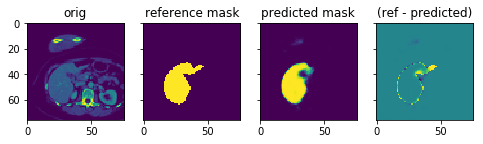

200/200 [==============================] - 4s 18ms/sample - loss: 0.0196
Epoch 31/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0365

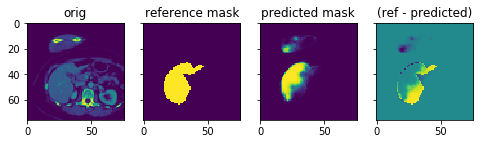

200/200 [==============================] - 4s 18ms/sample - loss: 0.0368
Epoch 32/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0332

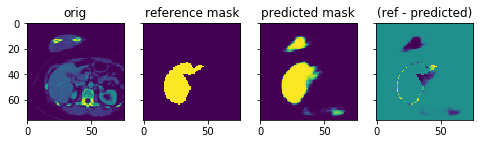

200/200 [==============================] - 4s 18ms/sample - loss: 0.0330
Epoch 33/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0252

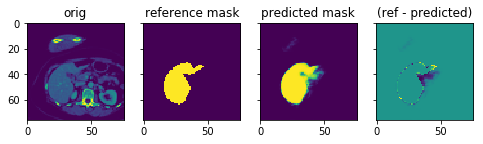

200/200 [==============================] - 4s 18ms/sample - loss: 0.0251
Epoch 34/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0193

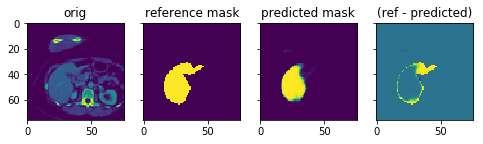

200/200 [==============================] - 4s 18ms/sample - loss: 0.0191
Epoch 35/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0217

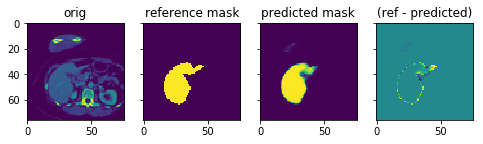

200/200 [==============================] - 4s 18ms/sample - loss: 0.0213
Epoch 36/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0151

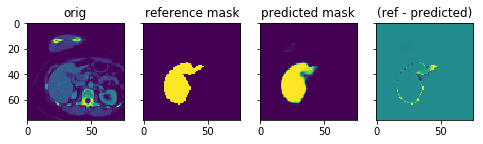

200/200 [==============================] - 4s 18ms/sample - loss: 0.0151
Epoch 37/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0147

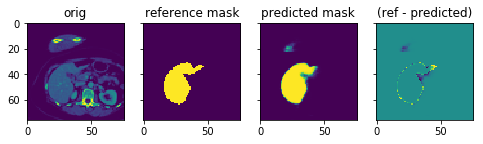

200/200 [==============================] - 4s 18ms/sample - loss: 0.0145
Epoch 38/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0135

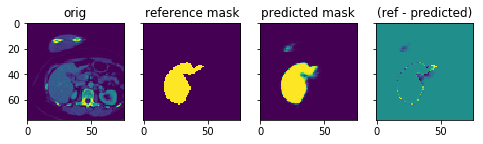

200/200 [==============================] - 4s 18ms/sample - loss: 0.0134
Epoch 39/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0139

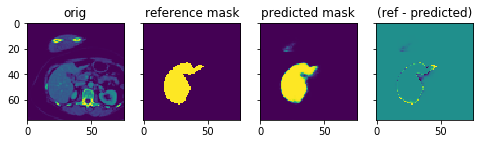

200/200 [==============================] - 4s 18ms/sample - loss: 0.0139
Epoch 40/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0123

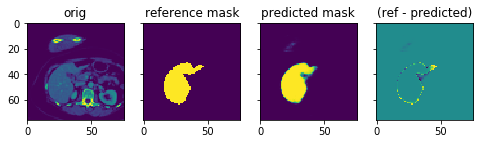

200/200 [==============================] - 4s 18ms/sample - loss: 0.0124
Epoch 41/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0126

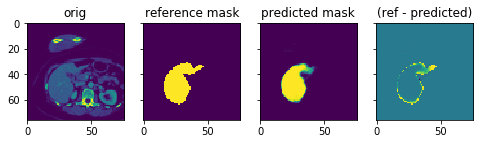

200/200 [==============================] - 4s 19ms/sample - loss: 0.0125
Epoch 42/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0117

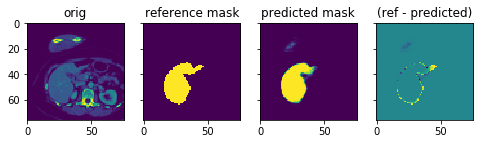

200/200 [==============================] - 4s 19ms/sample - loss: 0.0118
Epoch 43/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0127

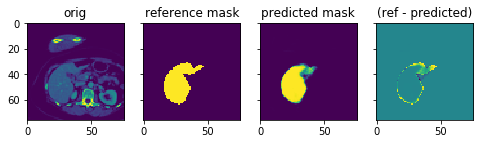

200/200 [==============================] - 4s 19ms/sample - loss: 0.0129
Epoch 44/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0129

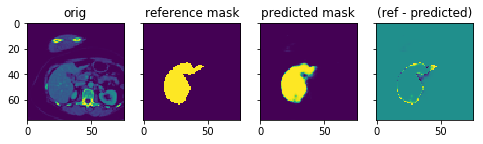

200/200 [==============================] - 4s 19ms/sample - loss: 0.0127
Epoch 45/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0111

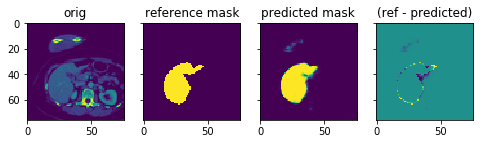

200/200 [==============================] - 4s 19ms/sample - loss: 0.0112
Epoch 46/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0109

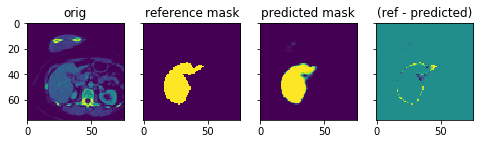

200/200 [==============================] - 5s 23ms/sample - loss: 0.0107
Epoch 47/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0101

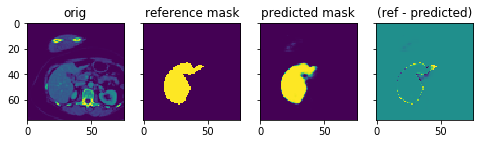

200/200 [==============================] - 4s 22ms/sample - loss: 0.0100
Epoch 48/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0092

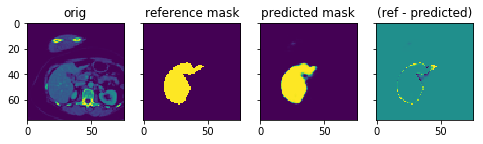

200/200 [==============================] - 4s 22ms/sample - loss: 0.0092
Epoch 49/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0084

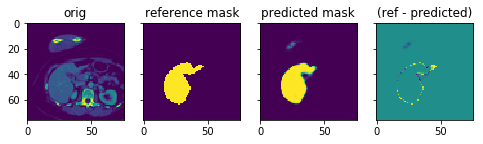

200/200 [==============================] - 4s 20ms/sample - loss: 0.0083
Epoch 50/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0085

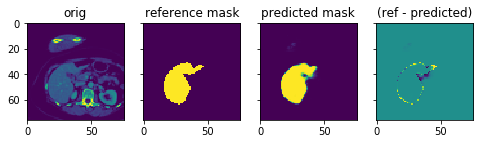

200/200 [==============================] - 4s 22ms/sample - loss: 0.0083
Epoch 51/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0082

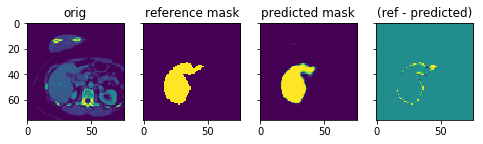

200/200 [==============================] - 4s 21ms/sample - loss: 0.0083
Epoch 52/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0083

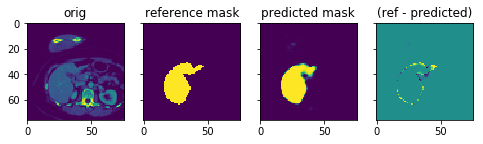

200/200 [==============================] - 4s 19ms/sample - loss: 0.0083
Epoch 53/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0076

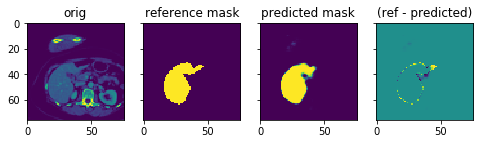

200/200 [==============================] - 4s 19ms/sample - loss: 0.0075
Epoch 54/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0069

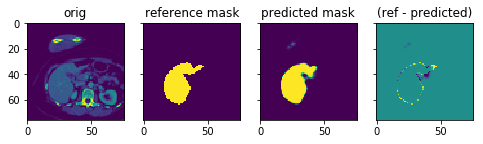

200/200 [==============================] - 4s 20ms/sample - loss: 0.0069
Epoch 55/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0066

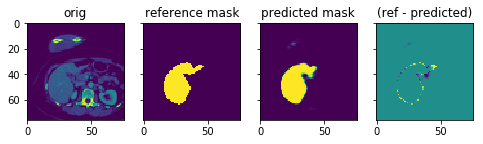

200/200 [==============================] - 4s 19ms/sample - loss: 0.0067
Epoch 56/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0069

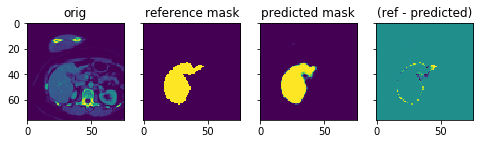

200/200 [==============================] - 4s 19ms/sample - loss: 0.0069
Epoch 57/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0064

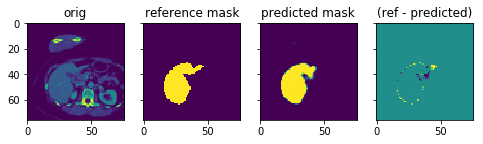

200/200 [==============================] - 4s 19ms/sample - loss: 0.0065
Epoch 58/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0063

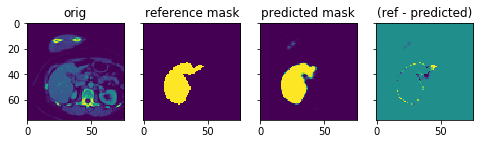

200/200 [==============================] - 4s 18ms/sample - loss: 0.0063
Epoch 59/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0060

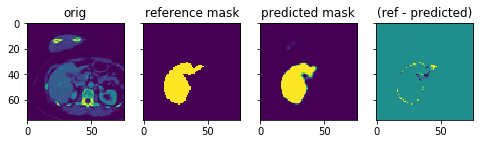

200/200 [==============================] - 4s 19ms/sample - loss: 0.0060
Epoch 60/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0058

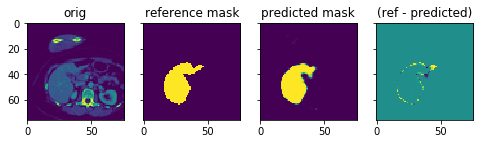

200/200 [==============================] - 4s 19ms/sample - loss: 0.0058
Epoch 61/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0062

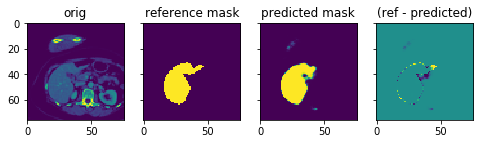

200/200 [==============================] - 4s 19ms/sample - loss: 0.0062
Epoch 62/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0066

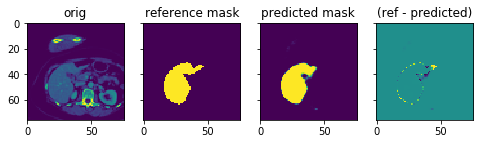

200/200 [==============================] - 4s 18ms/sample - loss: 0.0066
Epoch 63/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0061

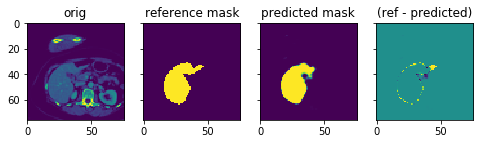

200/200 [==============================] - 4s 18ms/sample - loss: 0.0061
Epoch 64/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0061

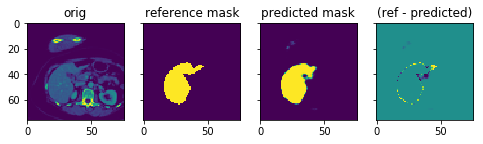

200/200 [==============================] - 4s 18ms/sample - loss: 0.0061
Epoch 65/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0065

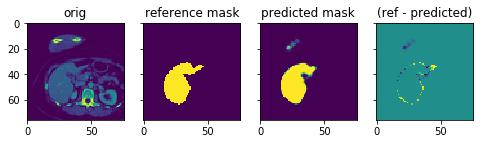

200/200 [==============================] - 4s 18ms/sample - loss: 0.0068
Epoch 66/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0078

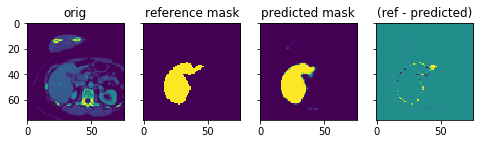

200/200 [==============================] - 4s 18ms/sample - loss: 0.0079
Epoch 67/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0070

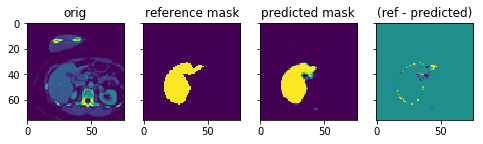

200/200 [==============================] - 4s 18ms/sample - loss: 0.0070
Epoch 68/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0061

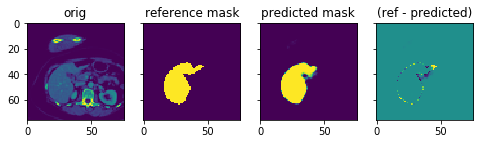

200/200 [==============================] - 4s 18ms/sample - loss: 0.0061
Epoch 69/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0057

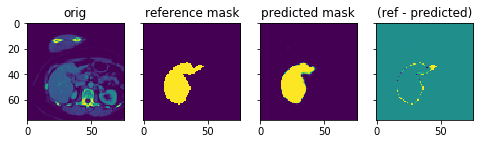

200/200 [==============================] - 4s 18ms/sample - loss: 0.0056
Epoch 70/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0063

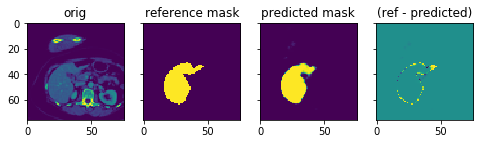

200/200 [==============================] - 4s 19ms/sample - loss: 0.0063
Epoch 71/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0054

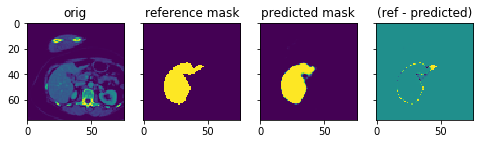

200/200 [==============================] - 4s 18ms/sample - loss: 0.0054
Epoch 72/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0049

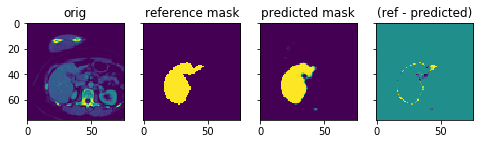

200/200 [==============================] - 4s 19ms/sample - loss: 0.0049
Epoch 73/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0046

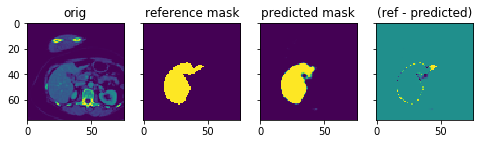

200/200 [==============================] - 4s 18ms/sample - loss: 0.0045
Epoch 74/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0046

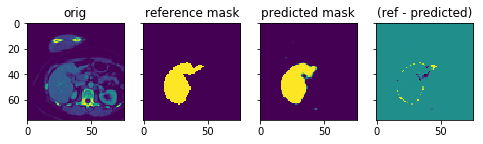

200/200 [==============================] - 4s 18ms/sample - loss: 0.0047
Epoch 75/75
190/200 [===========================>..] - ETA: 0s - loss: 0.0056

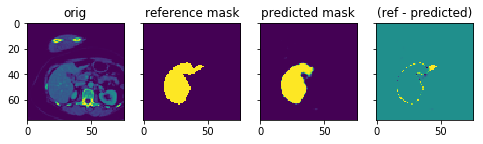

200/200 [==============================] - 4s 18ms/sample - loss: 0.0055


In [127]:
historyUNet = modelUNet.fit(x_train[...,np.newaxis],
                    y_train_binary[...,np.newaxis],
                    batch_size=10, epochs=75, callbacks=[vh_callback]) 

You can train the U-net also with other loss functions like the dice.

In [ ]:
modelUNetDice = get_batchnorm_unet(_activation='relu', _batch_norm=True)
modelUNetDice.compile(loss=dice_coef_loss, optimizer='adam')
print("Model parameters: {0:,}".format(model.count_params()))
historymodelUNetDice = modelmodelUNetDice.fit(x_train[...,np.newaxis],
                    y_train[...,np.newaxis],
                    batch_size=10, epochs=75, callbacks=[vh_callback]) 

In [ ]:
%%javascript
// This code generates the table of contents at the top of the notebook
$.getScript('https://kmahelona.github.io/ipython_notebook_goodies/ipython_notebook_toc.js')